#### The following notebook is a solution to the kaggle playground ep-17
##### Competition link- https://www.kaggle.com/competitions/playground-series-s3e17?rvi=1

In [ ]:
Public Score-0.98005
Private Score-0.98280
Best Model-CatBoost tuned using GridSearch

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

In [3]:
data_train= pd.read_csv('train.csv')
data_test=pd.read_csv('test.csv')
data_original=pd.read_csv('original.csv')

In [3]:
data_train.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0


In [4]:
data_train.shape,data_test.shape,data_original.shape

((136429, 14), (90954, 13), (10000, 14))

In [5]:
data_train.describe()

,id,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
count,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000
mean,68214.000000,299.862776,309.941070,1520.331110,40.348643,104.408901,0.015744,0.001554,0.005160,0.002397,0.003958,0.002258
std,39383.804275,1.862247,1.385173,138.736632,8.502229,63.965040,0.124486,0.039389,0.071649,0.048899,0.062789,0.047461
min,0.000000,295.300000,305.800000,1181.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,34107.000000,298.300000,308.700000,1432.000000,34.600000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,68214.000000,300.000000,310.000000,1493.000000,40.400000,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,102321.000000,301.200000,310.900000,1580.000000,46.100000,159.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,136428.000000,304.400000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
data_original.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [7]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136429 entries, 0 to 136428
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       136429 non-null  int64  
 1   Product ID               136429 non-null  object 
 2   Type                     136429 non-null  object 
 3   Air temperature [K]      136429 non-null  float64
 4   Process temperature [K]  136429 non-null  float64
 5   Rotational speed [rpm]   136429 non-null  int64  
 6   Torque [Nm]              136429 non-null  float64
 7   Tool wear [min]          136429 non-null  int64  
 8   Machine failure          136429 non-null  int64  
 9   TWF                      136429 non-null  int64  
 10  HDF                      136429 non-null  int64  
 11  PWF                      136429 non-null  int64  
 12  OSF                      136429 non-null  int64  
 13  RNF                      136429 non-null  int64  
dtypes: f

C:\Users\Shirshak\AppData\Local\Temp\ipykernel_19176\2288144426.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=(data_train.corr(method='spearman')).round(2),cmap='rocket',annot=True,annot_kws={'size':8})


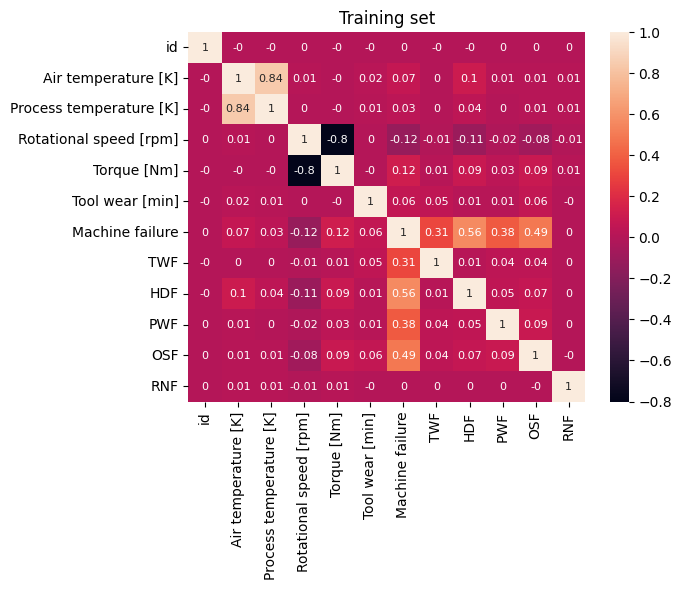

In [10]:
# 'Spearson relation'- When the relation between two variables is not linearly dependent or monotnic in nature i.e both
# variable move in same direction but not at constant rate.

# 'Pearson relation'- When the relation between two variables is linearly dependent i.e both variable move in same direction
#at constant rate.

sns.heatmap(data=(data_train.corr(method='spearman')).round(2),cmap='rocket',annot=True,annot_kws={'size':8})
plt.title('Training set')
plt.show()

C:\Users\Shirshak\AppData\Local\Temp\ipykernel_19176\1884196216.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=(data_test.corr(method='spearman')).round(2),cmap='crest',annot=True,annot_kws={'size':8})


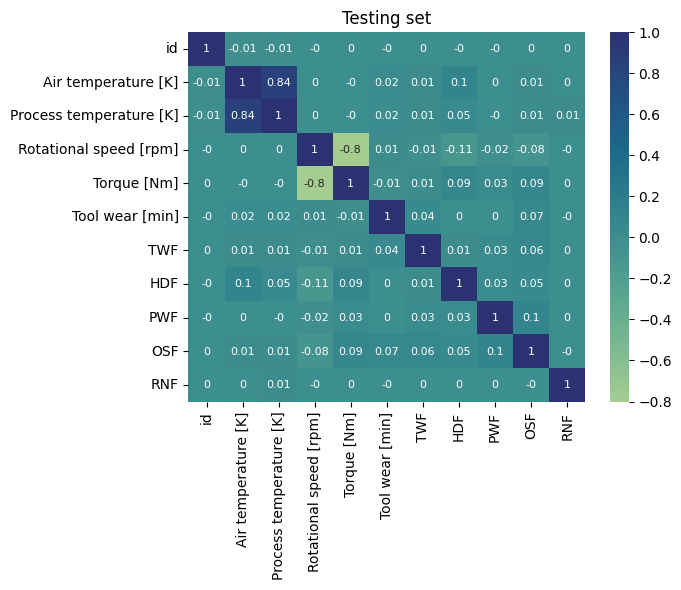

In [8]:
sns.heatmap(data=(data_test.corr(method='spearman')).round(2),cmap='crest',annot=True,annot_kws={'size':8})
plt.title('Testing set')
plt.show()

C:\Users\Shirshak\AppData\Local\Temp\ipykernel_19176\1017931509.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=(data_original.corr(method='spearman')).round(2),cmap='crest',annot=True,annot_kws={'size':8})


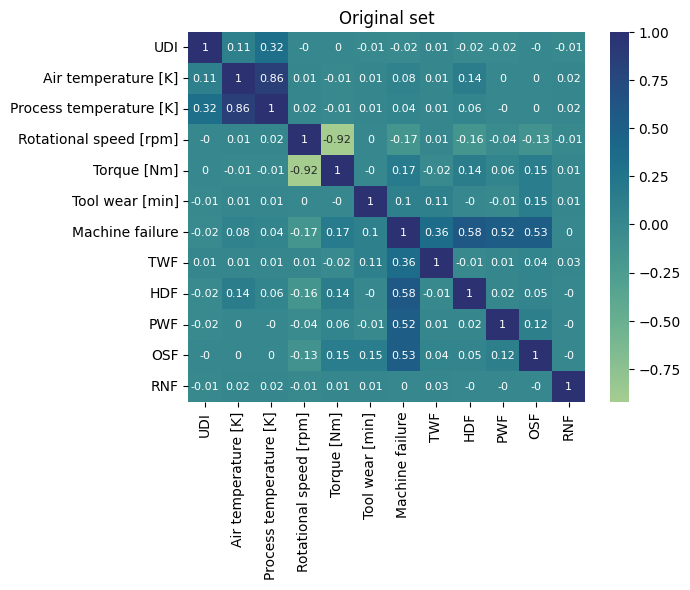

In [9]:
sns.heatmap(data=(data_original.corr(method='spearman')).round(2),cmap='crest',annot=True,annot_kws={'size':8})
plt.title('Original set')
plt.show()

In [ ]:
#Points to note:
#1)Strong negative correlation between Rotational speed and Torque
#2)Relation with Machine falilure column
    #Strong- None
    #Intermediate- HDF,TWF,PWF,OSF
    #Weak- Torque, Rotational speed

In [11]:
for feature in data_train.columns:
    print(f'{feature}:{len(data_train[feature].unique())}')

id:136429
Product ID:9976
Type:3
Air temperature [K]:95
Process temperature [K]:81
Rotational speed [rpm]:952
Torque [Nm]:611
Tool wear [min]:246
Machine failure:2
TWF:2
HDF:2
PWF:2
OSF:2
RNF:2


In [4]:
df_train=data_train.copy()

df_test=data_test.copy()

df_original=data_original.copy()

## Numerical data

In [35]:
numerical_features_train=[ feature for feature in df_train.columns if df_train[feature].dtype!='object']
numerical_features_train,len(numerical_features_train)

(['id',
  'Air temperature [K]',
  'Process temperature [K]',
  'Rotational speed [rpm]',
  'Torque [Nm]',
  'Tool wear [min]',
  'Machine failure',
  'TWF',
  'HDF',
  'PWF',
  'OSF',
  'RNF'],
 12)

#### Checking distribution with respect to machine failure

In [40]:
def plot_scatter(data,c=None,title=None,shape=None,features=None):
    fig,ax=plt.subplots(shape[0],shape[1],figsize=(32,32))
    features_train=features
    for i,x in enumerate(features_train):
        for j,y in enumerate(features_train):
            if x!=y or y!='id':
                ax[i,j].scatter(data[x],data[y],s=(5)**2,c=c,edgecolor='white')
                ax[i,j].set_xlabel(x,fontsize=15)
                ax[i,j].set_ylabel(y,fontsize=15)
    fig.suptitle(title,fontsize=30)
    plt.show()

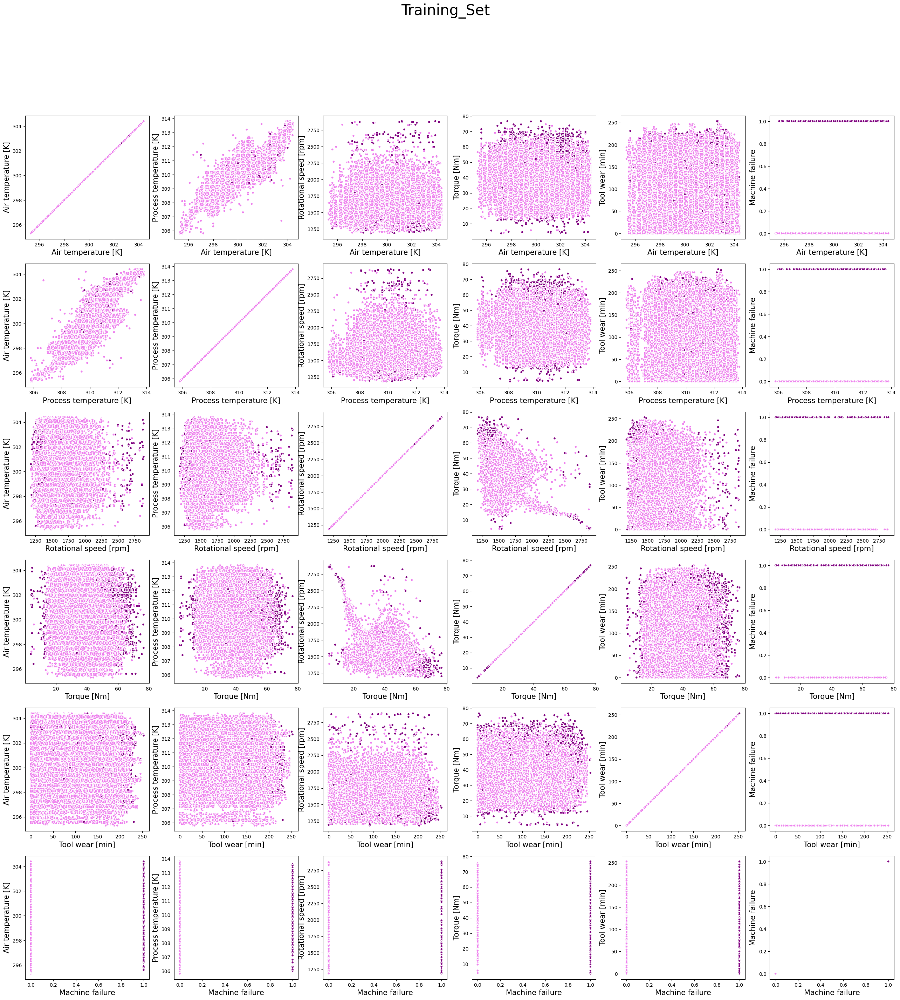

In [38]:
c_dict={0:'violet',1:'purple'}
plot_scatter(df_train,c=df_train['Machine failure'].map(c_dict),title='Training_Set',shape=(6,6),
             features=numerical_features_train[1:7])

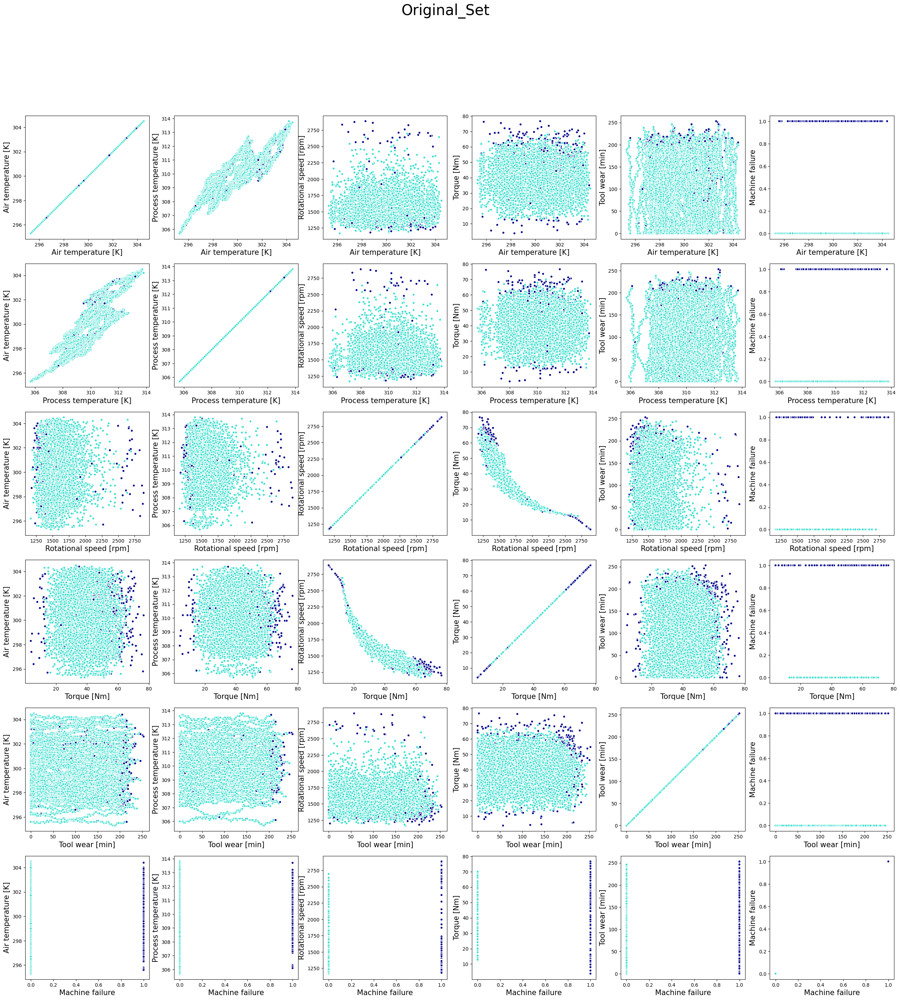

In [42]:
cdict={0:'turquoise',1:'darkblue'}
plot_scatter(df_original,c=df_original['Machine failure'].map(cdict),title='Original_Set',shape=(6,6),
             features=numerical_features_train[1:7])

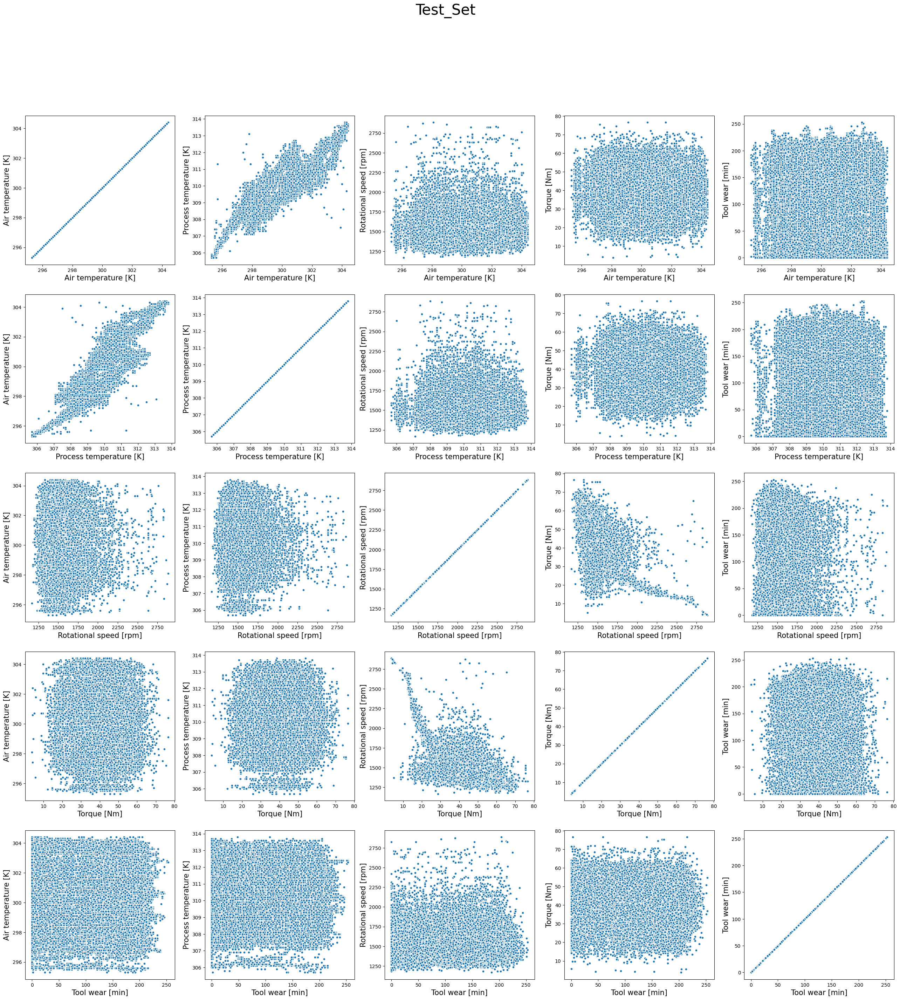

In [43]:
plot_scatter(df_test,shape=(5,5),title='Test_Set',features=numerical_features_train[1:6])

In [13]:
# New Observations
# 1)for torque majority of the failure cases seem to occur above 55 or below 17
# 2)for Rotational speed majority of the failure seems to lie below 1500 and above 2100 rpm
#The plots look quite similar !!!!!

#### Checking distribution of continuous columns

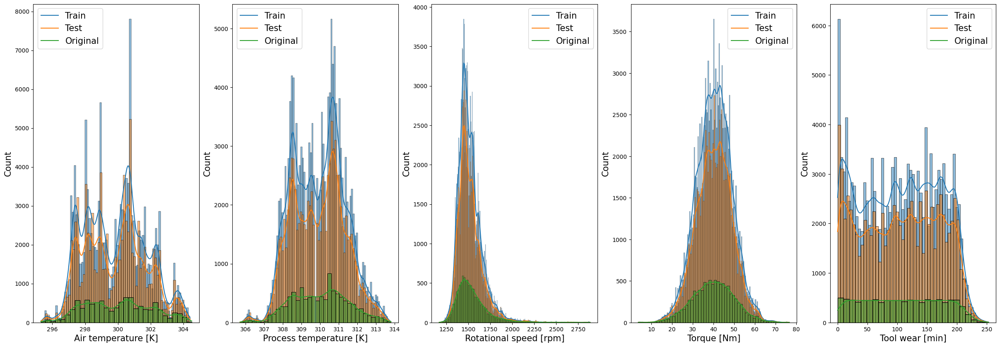

In [16]:
fig,ax=plt.subplots(1,5,figsize=(30,10))
features_train=numerical_features_train[1:6]
for j,y in enumerate(features_train):
    axes=ax[j]
    if y=='id':
        continue
    sns.histplot(df_train[y], kde=True, ax=axes, label='Train')
    sns.histplot(df_test[y], kde=True, ax=axes, label='Test')
    sns.histplot(df_original[y], kde=True, ax=axes, label='Orginal')
    axes.legend(['Train','Test','Original'],fontsize=15)
    axes.set_xlabel(y,fontsize=15)
    axes.set_ylabel('Count',fontsize=15)
        
plt.show()

In [48]:
#Observations
#Torque and Process temperature- Seems to be normalized
#Rotational speed- Right Skewed
#Tool wear- Seems to be more or less uniform distribution
#Can try and do sqrt transformation as no column contains negative values

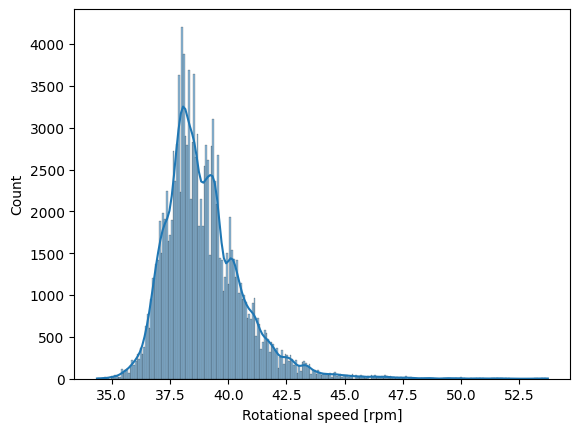

Skewness before:1.8882503109110036
Skewness after:1.2461065682787877


In [68]:
before=df_train['Rotational speed [rpm]'].skew()
sns.histplot(np.sqrt(df_train['Rotational speed [rpm]']), kde=True)
after=np.log(df_train['Rotational speed [rpm]']).skew()
plt.show()
print(f'Skewness before:{before}')
print(f'Skewness after:{after}')

In [62]:
#Hence it does work but it's still skewed 

#### Checking for outliers

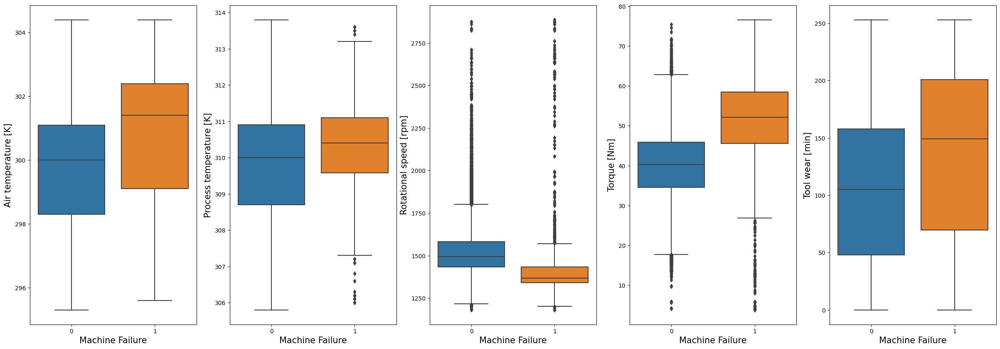

In [49]:
fig,ax=plt.subplots(1,5,figsize=(30,10))
features_train=numerical_features_train[1:6]
for j,y in enumerate(features_train):
    axes=ax[j]
    if y=='id':
        continue
    sns.boxplot(y=df_train[y],x=df_train['Machine failure'],ax=axes)
    axes.set_xlabel('Machine Failure',fontsize=15)
    axes.set_ylabel(y,fontsize=15)
        
plt.show()

In [1]:
# Not too bad for the most part, nothing  extremely unusual

## Categorical

In [5]:
categorical=[feature for feature in df_train.columns if df_train[feature].dtype=='object' ]
categorical

['Product ID', 'Type']

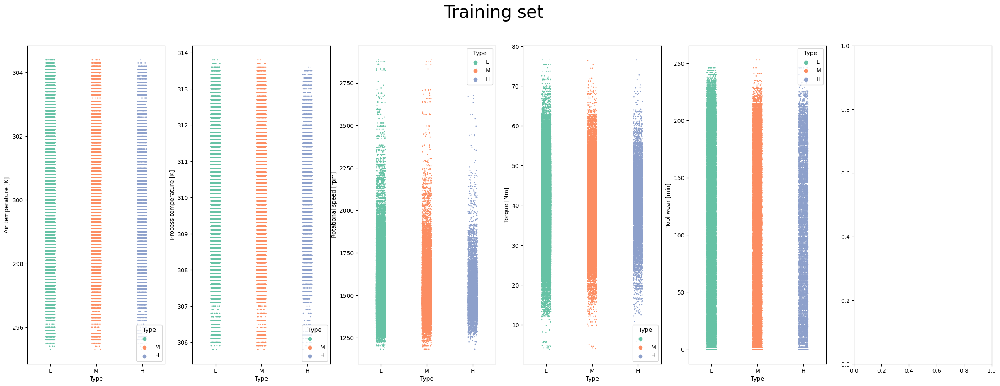

In [17]:
fig,ax=plt.subplots(1,6,figsize=(30,10))

for j,numerical in enumerate(features_train):
    axes=ax[j]
    sns.stripplot(data=df_train,x='Type', y=numerical,ax=axes,size=2,hue='Type',palette='Set2')
fig. suptitle("Training set", fontsize=30)
plt.show()
    

Text(0.5, 0.98, 'Testing set')

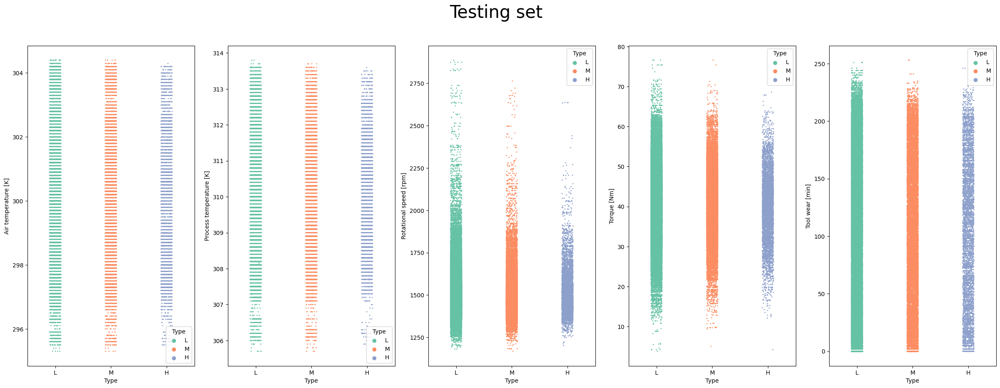

In [18]:
fig,ax=plt.subplots(1,5,figsize=(30,10))

for j,numerical in enumerate(features_train):
    if numerical=='Machine failure':
        continue
    axes=ax[j]
    sns.stripplot(data=df_test,x='Type', y=numerical,ax=axes,size=2,hue='Type',palette='Set2')
fig. suptitle("Testing set", fontsize=30)

In [89]:
#Cheching for imbalance
def plot_pie(colors=None,data=None,wp=None,labels=None,explode=None,axes=None,title=None):
    x=[len(data.loc[data['Machine failure']==0])/data.shape[0],
       len(data.loc[data['Machine failure']==1])/data.shape[0]]
    wedges, texts, autotexts=axes.pie(x=x,labels=labels,explode=explode,shadow=True,colors=colors,
    wedgeprops = wp,autopct='%1.1f%%')
    
    plt.setp(autotexts, size=15)
    axes.set_title(title,fontsize=20)

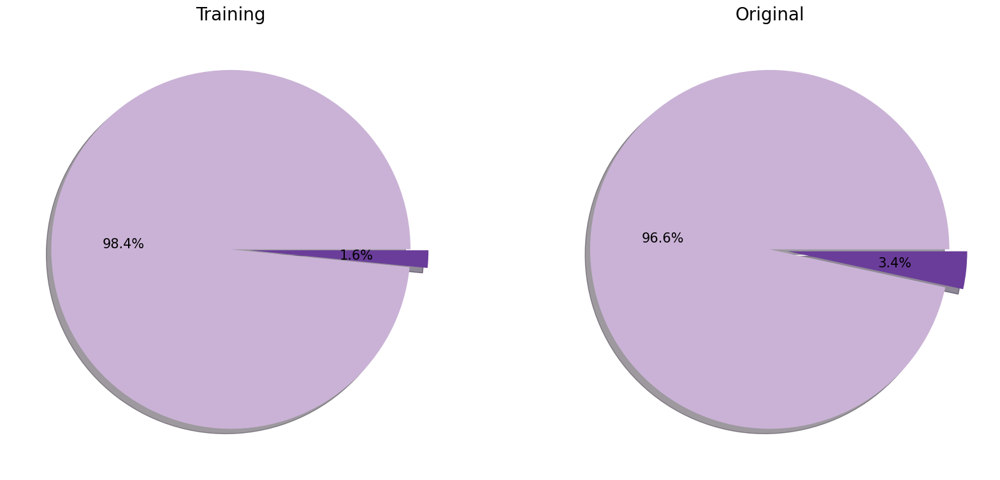

In [90]:
fig,ax=plt.subplots(1,2,figsize=(20,10))
colors = sns.color_palette('Paired')[8:10]
# wp = { 'linewidth' : 1, 'edgecolor' : "black" }
plot_pie(colors,df_train,explode=[0,0.1],axes=ax[0],title='Training')
plot_pie(colors,df_original,explode=[0,0.1],axes=ax[1],title='Original')

## Feature enginnering

In [13]:
df_original['id']=df_original['UDI'].copy()
df_original.drop(['UDI'],inplace=True,axis=1)

In [14]:
#Combining all datasets into one
df_train=data_train.copy()
modified_train=data_train.copy()
df_all=pd.concat([df_train,df_original],axis=0,ignore_index=True)
df_test=data_test.copy()

In [15]:
#Combined dataset
df_all

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146424,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
146425,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
146426,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
146427,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


In [46]:
#Training data
for feature in df_train.columns:
    print(f'{feature}:{df_train[feature].isnull().sum()}')

id:0
Product ID:0
Type:0
Air temperature [K]:0
Process temperature [K]:0
Rotational speed [rpm]:0
Torque [Nm]:0
Tool wear [min]:0
Machine failure:0
TWF:0
HDF:0
PWF:0
OSF:0
RNF:0


In [47]:
#Test data
for feature in df_test.columns:
    print(f'{feature}:{df_test[feature].isnull().sum()}')

id:0
Product ID:0
Type:0
Air temperature [K]:0
Process temperature [K]:0
Rotational speed [rpm]:0
Torque [Nm]:0
Tool wear [min]:0
TWF:0
HDF:0
PWF:0
OSF:0
RNF:0


In [48]:
for feature in df_all.columns:
    print(f'{feature}:{df_all[feature].isnull().sum()}')

id:0
Product ID:0
Type:0
Air temperature [K]:0
Process temperature [K]:0
Rotational speed [rpm]:0
Torque [Nm]:0
Tool wear [min]:0
Machine failure:0
TWF:0
HDF:0
PWF:0
OSF:0
RNF:0


In [ ]:
#NO NULL VALUES

In [49]:
#Engineered features
# omega=(2*3.14*df_all['Rotational speed [rpm]'])/60
df_all['Power']=df_all['Rotational speed [rpm]']*df_all['Torque [Nm]']

temp_diff=abs(df_all['Air temperature [K]']-df_all['Process temperature [K]'])
df_all['Temperature difference']=temp_diff

temp_ratio=df_all['Air temperature [K]']/df_all['Process temperature [K]']
df_all['Temperature ratio']=temp_ratio

In [20]:
Id=[]
for val in df_all['Product ID']:
    if val[0]=='H':
        new_id='0'+val[1:]
        Id.append(int(new_id))
    elif val[0]=='L':
        new_id='1'+val[1:]
        Id.append(int(new_id))
    else:
        new_id='2'+val[1:]
        Id.append(int(new_id))
df_all['Product ID']=Id   

C:\Users\Shirshak\AppData\Local\Temp\ipykernel_14108\870582917.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=(df_all.corr(method='spearman')).round(2),cmap='rocket',annot=True,annot_kws={'size':15})


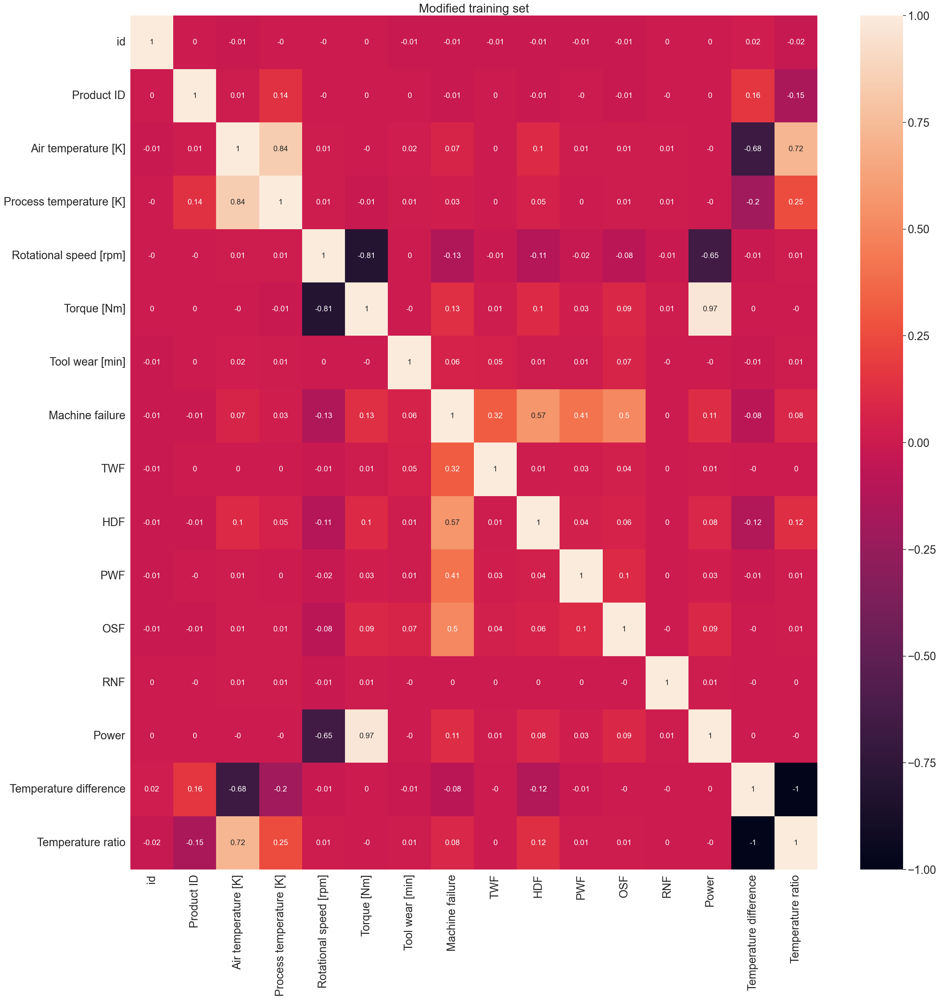

In [21]:
#Checking correlation again
plt.figure(figsize=(30,30))
sns.set_theme(font_scale=2)
sns.heatmap(data=(df_all.corr(method='spearman')).round(2),cmap='rocket',annot=True,annot_kws={'size':15})
plt.title('Modified training set')
plt.show()

In [50]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler,MinMaxScaler
from sklearn.compose import make_column_transformer

In [51]:
features_scale=[feature for feature in df_all.columns if feature not in ['Machine failure','Type',"Product ID"]]

In [52]:
features_scale

['id',
 'Air temperature [K]',
 'Process temperature [K]',
 'Rotational speed [rpm]',
 'Torque [Nm]',
 'Tool wear [min]',
 'TWF',
 'HDF',
 'PWF',
 'OSF',
 'RNF',
 'Power',
 'Temperature difference',
 'Temperature ratio']

In [53]:
def scale(data,feature_scale):
    
    ohe=OneHotEncoder()
    scaler=MinMaxScaler(copy=True,feature_range=(0,1))
    
    ct=make_column_transformer((scaler,features_scale),remainder='passthrough')
    transformed=ct.fit_transform(data)
    #features_scale.extend(['H','L','M'])
    
    for column in data.columns:
        if column not in features_scale: #and column!='Type':
            features_scale.append(column)
    data=pd.DataFrame(transformed, columns=features_scale)
    #data.drop(['Product ID'],axis=1,inplace=True)
    return data

In [55]:
data=scale(df_all,features_scale)

In [56]:
data

,id,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Power,Temperature difference,Temperature ratio,Product ID,Type,Machine failure
0,0.0,0.576087,0.481481,0.249127,0.443681,0.55336,0.0,0.0,0.0,0.0,0.0,0.352222,0.491525,0.506144,L50096,L,0
1,0.000007,0.793478,0.790123,0.344005,0.347527,0.790514,0.0,0.0,0.0,0.0,0.0,0.308497,0.533898,0.46986,M20343,M,0
2,0.000015,0.434783,0.345679,0.37078,0.311813,0.098814,0.0,0.0,0.0,0.0,0.0,0.285682,0.508475,0.486217,L49454,L,0
3,0.000022,0.619565,0.641975,0.207218,0.556319,0.778656,0.0,0.0,0.0,0.0,0.0,0.41954,0.567797,0.432652,L53355,L,0
4,0.000029,0.293478,0.407407,0.27532,0.434066,0.134387,0.0,0.0,0.0,0.0,0.0,0.355458,0.661017,0.333127,M24050,M,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146424,0.073269,0.380435,0.333333,0.253783,0.353022,0.055336,0.0,0.0,0.0,0.0,0.0,0.282183,0.542373,0.45159,M24855,M,0
146425,0.073277,0.391304,0.333333,0.270081,0.384615,0.067194,0.0,0.0,0.0,0.0,0.0,0.313331,0.533898,0.460183,H39410,H,0
146426,0.073284,0.402174,0.358025,0.277648,0.406593,0.086957,0.0,0.0,0.0,0.0,0.0,0.334044,0.542373,0.452124,M24857,M,0
146427,0.073291,0.402174,0.37037,0.139697,0.614011,0.098814,0.0,0.0,0.0,0.0,0.0,0.42481,0.550847,0.443807,H39412,H,0


## Feature selection

In [29]:
Binary_features=features_scale[6:11]
for feature in Binary_features:
    print(data[feature].value_counts())

0.000000    3910
0.007905    1840
0.470356    1505
0.233202    1485
0.019763    1482
            ... 
0.952569       8
0.936759       7
0.944664       7
1.000000       4
0.992095       2
Name: Tool wear [min], Length: 246, dtype: int64
0.0    146171
1.0       258
Name: TWF, dtype: int64
0.0    145610
1.0       819
Name: HDF, dtype: int64
0.0    146007
1.0       422
Name: PWF, dtype: int64
0.0    145791
1.0       638
Name: OSF, dtype: int64


### Filter methods

In [28]:
from sklearn.feature_selection import mutual_info_classif, chi2, SelectKBest
from skfeature.function.similarity_based import fisher_score

In [29]:
#1) Information gain
X=data.copy()
X.drop('Machine failure',axis=1,inplace=True)
Y=data[['Machine failure']]

Y=np.array(Y).astype('int32')
Y=Y.reshape((Y.shape[0],))

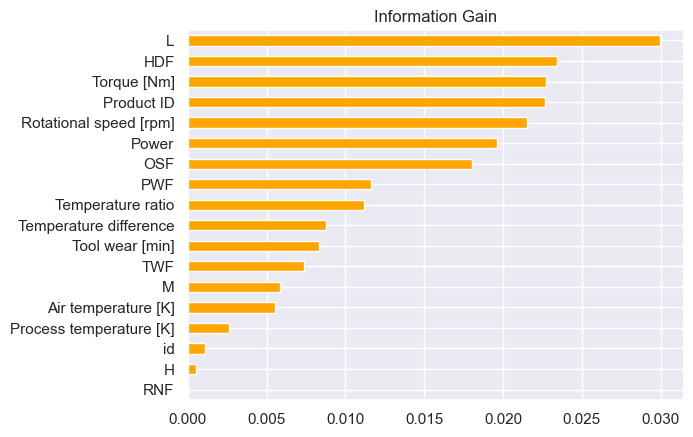

In [30]:
imp=mutual_info_classif(X,Y)
sns.set_theme(font_scale=1)
plot_imp=pd.Series(imp, X.columns)
plot_imp.sort_values().plot(kind='barh',color='orange')
plt.title('Information Gain')
plt.show()

In [113]:
best_features={}
for val,feat in zip(imp,np.array(X.columns)):
    best_features[feat]=val

In [119]:
keys = list(best_features.keys())
values = list(best_features.values())
sorted_value_index = np.argsort(values)
sorted_dict = {keys[i]: values[i] for i in sorted_value_index}
 
best=list(sorted_dict.keys())
print(best)

['RNF', 'id', 'H', 'Process temperature [K]', 'M', 'Air temperature [K]', 'TWF', 'Tool wear [min]', 'PWF', 'OSF', 'Rotational speed [rpm]', 'Torque [Nm]', 'HDF', 'L']


In [143]:
#Chi square test
chi_features=SelectKBest(chi2, k=8)
Best_features=chi_features.fit_transform(X,Y)

Best_features.shape

(136429, 8)

In [83]:
#Lasso Regression
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
pd.pandas.set_option("display.max_columns",None)

In [229]:
def LassoSelection(data):
    X_train=data.copy()
    X_train.drop(['Machine failure','Product ID','Type'],axis=1,inplace=True)

    Y_train=data['Machine failure']
    
    feature_sel_model=SelectFromModel(Lasso(alpha=0.0004,random_state=0))
    feature_sel_model.fit(X_train,Y_train)
    
    selected_feature = X_train.columns[(feature_sel_model.get_support())]

    print('total features: {}'.format((X_train.shape[1])))
    print('selected features: {}'.format(len(selected_feature)))
    print('features with coefficients shrank to zero: {}'.format(np.sum(feature_sel_model.estimator_.coef_ == 0)))
    return selected_feature

In [230]:
selected_feature=LassoSelection(data)
selected_feature

total features: 14
selected features: 6
features with coefficients shrank to zero: 8


Index(['Torque [Nm]', 'Tool wear [min]', 'TWF', 'HDF', 'PWF', 'OSF'], dtype='object')

In [231]:
#Top 6 features from each test
# Impurity Gain-['Tool wear [min]', 'PWF', 'OSF', 'Rotational speed [rpm]', 'Torque [Nm]', 'HDF', 'L','M','H']
# Lasso-['Torque [Nm]', 'Tool wear [min]', 'TWF', 'HDF', 'PWF', 'OSF','L','H','M']
# Correlation-['TWF', 'HDF', 'PWF', 'OSF','L','H','M','Torque [Nm]','Rotational speed [rpm]']

In [232]:
selected_feature=list(selected_feature)
selected_feature.extend(['Rotational speed [rpm]','Temperature ratio','Type','Product ID'])

In [233]:
# Getting top selected features
X_train=data[selected_feature]
Y_train=data['Machine failure']

In [32]:
X_train=df_train.copy()
X_train.drop(["Machine failure",'id'],axis=1,inplace=True)
Y_train=df_train['Machine failure']

In [193]:
X_train,X_test,Y_train,Y_test=train_test_split(X_train,Y_train,test_size=0.2,random_state=42,stratify=Y_train)

In [135]:
#Oversmapling/Undersampling
from imblearn.over_sampling import SMOTE,ADASYN
from imblearn.combine import SMOTEENN, SMOTETomek
from collections import Counter

In [136]:
smt=SMOTE()
ada=ADASYN()
sme=SMOTEENN()
smtt=SMOTETomek()

In [137]:
X_train_smt,Y_train_smt=smt.fit_resample(X_train,Y_train)

X_train_ada,Y_train_ada=ada.fit_resample(X_train,Y_train)

X_train_sme,Y_train_sme=sme.fit_resample(X_train,Y_train)

X_train_smtt,Y_train_smtt=smtt.fit_resample(X_train,Y_train)

In [139]:
#All datasets
X_train_smt=np.array(X_train_smt).astype('float32')
Y_train_smt=np.array(Y_train_smt).astype('float32')

X_train_ada=np.array(X_train_ada).astype('float32')
Y_train_ada=np.array(Y_train_ada).astype('float32')

X_train_sme=np.array(X_train_sme).astype('float32')
Y_train_sme=np.array(Y_train_sme).astype('float32')

X_train_smtt=np.array(X_train_smtt).astype('float32')
Y_train_smtt=np.array(Y_train_smtt).astype('float32')

In [43]:
X_train=np.array(X_train)
Y_train=np.array(Y_train).astype("float32")

X_test=np.array(X_test).astype('float32')
Y_test=np.array(Y_test).astype('float32')

In [42]:
Y_train

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0
1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0
2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0
3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0
4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
136424,M22284,M,300.1,311.4,1530,37.5,210,0,0,0,0,0
136425,H38017,H,297.5,308.5,1447,49.1,2,0,0,0,0,0
136426,L54690,L,300.5,311.8,1524,38.5,214,0,0,0,0,0
136427,L53876,L,301.7,310.9,1447,46.3,42,0,0,0,0,0


In [34]:
X_train=data.copy()
X_train.drop(['Product ID','Machine failure'],axis=1,inplace=True)
X_train

Y_train=data['Machine failure']

X_train=np.array(X_train).astype('float32')
Y_train=np.array(Y_train).astype('float32')

## Training model

In [33]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier,StackingClassifier
from sklearn.model_selection import cross_validate, train_test_split,StratifiedKFold
from sklearn.metrics import roc_auc_score,classification_report
from sklearn import metrics
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from statistics import mean
from optuna.integration import LightGBMPruningCallback
import optuna

#Boosting models
import xgboost as xgb
import lightgbm as LGBM
from catboost import CatBoostClassifier as CBC

In [38]:
categorical_features_indices = [0,1]
categorical_features_indices

[0, 1]

In [39]:
#Models
LR=LogisticRegression(C=1.5)
svc=SVC()
rfc=RandomForestClassifier(n_estimators= 922,
 min_samples_split= 4,                                                           
 min_samples_leaf=8,
 max_features='auto',
 max_depth= 10,
 criterion= 'entropy',
 class_weight= {0: 1, 1: 2})

XGBC=xgb.XGBClassifier(n_estimators=158,learning_rate=0.1,max_depth=6,min_child_weight= 3,subsample=0.8,
 colsample_bytree=0.3,gamma=0.3,objective= 'binary:logistic',reg_lambda=0.005,scale_pos_weight=4,seed=27)


LGBMC=LGBM.LGBMClassifier(n_estimators=850,learning_rate=0.02,num_leaves=90,max_depth=4,lambda_l1=0.135,lambda_l2= 0.07,
min_child_weight=2,min_child_samples= 10,bagging_fraction= 0.6000000000000001,bagging_freq= 1,feature_fraction= 0.4,
scale_pos_weight= 7)

estimators=[('XGBC',XGBC),("LGMBC",LGBMC)]
StackedModel=StackingClassifier(estimators=estimators,final_estimator=cbc,stack_method='predict_proba')
models=[cbc]

In [222]:
X_train,X_test,Y_train,Y_test=train_test_split(X_train,Y_train,test_size=0.2,random_state=42,stratify=Y_train)

In [203]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (rmse): 0.97249
	Best params:
		n_estimators: 850
		learning_rate: 0.02
		num_leaves: 90
		max_depth: 4
		lambda_l1: 0.135
		lambda_l2: 0.07
		min_child_weight: 2
		min_child_samples: 10
		scale_pos_weight: 7
		bagging_fraction: 0.6000000000000001
		bagging_freq: 1
		feature_fraction: 0.4


In [ ]:
#for cross validation
# for model in models:
#     result=cross_validate(model,X_train,Y_train,scoring='roc_auc',cv=5,return_train_score=True,n_jobs=-1)
#     print(f"{str(model)}:{result['test_score']}")
#     print(f"Max score:{max(result['test_score'])}")
#     print(f"Min score:{min(result['test_score'])}")
#     print(f"Mean score:{mean(result['test_score'])}")

In [44]:
#Stratified cross validation
def StratifiedKfold(models,X_train,Y_train):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1) 
    lst_accu_stratified = []
    for model in models:
        for train_index, test_index in skf.split(X_train, Y_train): 
            X_train_fold, X_test_fold = X_train[train_index], X_train[test_index] 
            y_train_fold, y_test_fold = Y_train[train_index], Y_train[test_index] 
            model.fit(X_train_fold, y_train_fold) 
            y_pred_prob=model.predict_proba(X_test_fold)[:,1]
            lst_accu_stratified.append(roc_auc_score(y_test_fold,y_pred_prob))
        print(f'{model}:')
        print('Maximum AUC',max(lst_accu_stratified)) 
        print('Minimum AUC:',min(lst_accu_stratified)) 
        print('Overall AUC:',mean(lst_accu_stratified))

In [45]:
StratifiedKfold(models,X_train,Y_train)

0:	learn: 0.8022935	total: 74.1ms	remaining: 57.1s
1:	learn: 0.8884750	total: 143ms	remaining: 55.2s
2:	learn: 0.9154237	total: 212ms	remaining: 54.3s
3:	learn: 0.9154212	total: 265ms	remaining: 51s
4:	learn: 0.9337822	total: 336ms	remaining: 51.6s
5:	learn: 0.9337821	total: 399ms	remaining: 50.9s
6:	learn: 0.9333337	total: 468ms	remaining: 51.1s
7:	learn: 0.9333351	total: 526ms	remaining: 50.3s
8:	learn: 0.9333322	total: 598ms	remaining: 50.7s
9:	learn: 0.9333330	total: 663ms	remaining: 50.6s
10:	learn: 0.9350810	total: 729ms	remaining: 50.4s
11:	learn: 0.9401786	total: 796ms	remaining: 50.4s
12:	learn: 0.9435787	total: 873ms	remaining: 51s
13:	learn: 0.9435795	total: 944ms	remaining: 51.1s
14:	learn: 0.9464553	total: 1.01s	remaining: 50.9s
15:	learn: 0.9464571	total: 1.07s	remaining: 50.7s
16:	learn: 0.9467012	total: 1.14s	remaining: 50.5s
17:	learn: 0.9463708	total: 1.2s	remaining: 50.2s
18:	learn: 0.9461390	total: 1.26s	remaining: 50s
19:	learn: 0.9461390	total: 1.29s	remaining: 48

161:	learn: 0.9735492	total: 9.98s	remaining: 37.6s
162:	learn: 0.9735653	total: 10s	remaining: 37.5s
163:	learn: 0.9735676	total: 10.1s	remaining: 37.4s
164:	learn: 0.9735665	total: 10.2s	remaining: 37.3s
165:	learn: 0.9735697	total: 10.2s	remaining: 37.3s
166:	learn: 0.9735742	total: 10.3s	remaining: 37.2s
167:	learn: 0.9735880	total: 10.3s	remaining: 37.2s
168:	learn: 0.9736079	total: 10.4s	remaining: 37.1s
169:	learn: 0.9736037	total: 10.5s	remaining: 37s
170:	learn: 0.9736064	total: 10.5s	remaining: 36.9s
171:	learn: 0.9736063	total: 10.6s	remaining: 36.8s
172:	learn: 0.9736653	total: 10.6s	remaining: 36.8s
173:	learn: 0.9736751	total: 10.7s	remaining: 36.7s
174:	learn: 0.9737320	total: 10.8s	remaining: 36.7s
175:	learn: 0.9737345	total: 10.8s	remaining: 36.6s
176:	learn: 0.9738099	total: 10.9s	remaining: 36.5s
177:	learn: 0.9738609	total: 10.9s	remaining: 36.5s
178:	learn: 0.9738952	total: 11s	remaining: 36.4s
179:	learn: 0.9739180	total: 11s	remaining: 36.3s
180:	learn: 0.973924

320:	learn: 0.9753165	total: 19.9s	remaining: 28s
321:	learn: 0.9753151	total: 20s	remaining: 28s
322:	learn: 0.9753105	total: 20.1s	remaining: 27.9s
323:	learn: 0.9753333	total: 20.1s	remaining: 27.8s
324:	learn: 0.9754065	total: 20.2s	remaining: 27.8s
325:	learn: 0.9754329	total: 20.3s	remaining: 27.7s
326:	learn: 0.9754324	total: 20.3s	remaining: 27.6s
327:	learn: 0.9754550	total: 20.4s	remaining: 27.6s
328:	learn: 0.9754835	total: 20.5s	remaining: 27.5s
329:	learn: 0.9754891	total: 20.5s	remaining: 27.5s
330:	learn: 0.9754927	total: 20.6s	remaining: 27.4s
331:	learn: 0.9754960	total: 20.6s	remaining: 27.3s
332:	learn: 0.9754946	total: 20.7s	remaining: 27.3s
333:	learn: 0.9754983	total: 20.7s	remaining: 27.2s
334:	learn: 0.9755219	total: 20.8s	remaining: 27.1s
335:	learn: 0.9755281	total: 20.9s	remaining: 27.1s
336:	learn: 0.9755485	total: 20.9s	remaining: 27s
337:	learn: 0.9755500	total: 21s	remaining: 26.9s
338:	learn: 0.9755541	total: 21s	remaining: 26.9s
339:	learn: 0.9756296	to

480:	learn: 0.9774697	total: 29.7s	remaining: 18s
481:	learn: 0.9774754	total: 29.7s	remaining: 17.9s
482:	learn: 0.9774967	total: 29.8s	remaining: 17.8s
483:	learn: 0.9774967	total: 29.9s	remaining: 17.8s
484:	learn: 0.9774954	total: 29.9s	remaining: 17.7s
485:	learn: 0.9775112	total: 30s	remaining: 17.7s
486:	learn: 0.9775202	total: 30.1s	remaining: 17.6s
487:	learn: 0.9775340	total: 30.1s	remaining: 17.5s
488:	learn: 0.9775348	total: 30.2s	remaining: 17.5s
489:	learn: 0.9775365	total: 30.3s	remaining: 17.4s
490:	learn: 0.9775355	total: 30.3s	remaining: 17.4s
491:	learn: 0.9775659	total: 30.4s	remaining: 17.3s
492:	learn: 0.9775722	total: 30.5s	remaining: 17.2s
493:	learn: 0.9775909	total: 30.5s	remaining: 17.2s
494:	learn: 0.9775996	total: 30.6s	remaining: 17.1s
495:	learn: 0.9775991	total: 30.7s	remaining: 17.1s
496:	learn: 0.9775930	total: 30.7s	remaining: 17s
497:	learn: 0.9776380	total: 30.8s	remaining: 17s
498:	learn: 0.9776412	total: 30.9s	remaining: 16.9s
499:	learn: 0.977641

640:	learn: 0.9794730	total: 40s	remaining: 8.18s
641:	learn: 0.9794812	total: 40.1s	remaining: 8.12s
642:	learn: 0.9794875	total: 40.1s	remaining: 8.05s
643:	learn: 0.9795446	total: 40.2s	remaining: 7.99s
644:	learn: 0.9795582	total: 40.3s	remaining: 7.93s
645:	learn: 0.9795583	total: 40.3s	remaining: 7.87s
646:	learn: 0.9795560	total: 40.4s	remaining: 7.8s
647:	learn: 0.9795554	total: 40.4s	remaining: 7.74s
648:	learn: 0.9795578	total: 40.5s	remaining: 7.68s
649:	learn: 0.9795574	total: 40.6s	remaining: 7.62s
650:	learn: 0.9795617	total: 40.6s	remaining: 7.55s
651:	learn: 0.9795651	total: 40.7s	remaining: 7.49s
652:	learn: 0.9795672	total: 40.8s	remaining: 7.43s
653:	learn: 0.9795890	total: 40.8s	remaining: 7.37s
654:	learn: 0.9795792	total: 40.9s	remaining: 7.31s
655:	learn: 0.9795823	total: 41s	remaining: 7.24s
656:	learn: 0.9795930	total: 41s	remaining: 7.18s
657:	learn: 0.9795948	total: 41.1s	remaining: 7.12s
658:	learn: 0.9795943	total: 41.1s	remaining: 7.05s
659:	learn: 0.97961

31:	learn: 0.9668449	total: 2.17s	remaining: 50.2s
32:	learn: 0.9668126	total: 2.23s	remaining: 50s
33:	learn: 0.9682052	total: 2.3s	remaining: 49.9s
34:	learn: 0.9686266	total: 2.36s	remaining: 49.7s
35:	learn: 0.9686180	total: 2.44s	remaining: 49.8s
36:	learn: 0.9686762	total: 2.5s	remaining: 49.7s
37:	learn: 0.9687676	total: 2.56s	remaining: 49.5s
38:	learn: 0.9695647	total: 2.62s	remaining: 49.3s
39:	learn: 0.9695759	total: 2.69s	remaining: 49.2s
40:	learn: 0.9695877	total: 2.75s	remaining: 49s
41:	learn: 0.9695608	total: 2.8s	remaining: 48.8s
42:	learn: 0.9698651	total: 2.87s	remaining: 48.7s
43:	learn: 0.9704503	total: 2.93s	remaining: 48.5s
44:	learn: 0.9704559	total: 2.99s	remaining: 48.3s
45:	learn: 0.9704700	total: 3.05s	remaining: 48.2s
46:	learn: 0.9705372	total: 3.12s	remaining: 48.1s
47:	learn: 0.9706896	total: 3.18s	remaining: 47.9s
48:	learn: 0.9707765	total: 3.24s	remaining: 47.8s
49:	learn: 0.9709161	total: 3.29s	remaining: 47.6s
50:	learn: 0.9710556	total: 3.35s	rema

192:	learn: 0.9753279	total: 12.4s	remaining: 37.2s
193:	learn: 0.9753581	total: 12.5s	remaining: 37.1s
194:	learn: 0.9753733	total: 12.5s	remaining: 37s
195:	learn: 0.9753790	total: 12.6s	remaining: 37s
196:	learn: 0.9753785	total: 12.6s	remaining: 36.9s
197:	learn: 0.9753725	total: 12.7s	remaining: 36.8s
198:	learn: 0.9753725	total: 12.8s	remaining: 36.8s
199:	learn: 0.9753836	total: 12.8s	remaining: 36.7s
200:	learn: 0.9753812	total: 12.9s	remaining: 36.6s
201:	learn: 0.9754250	total: 13s	remaining: 36.6s
202:	learn: 0.9754389	total: 13s	remaining: 36.5s
203:	learn: 0.9754653	total: 13.1s	remaining: 36.4s
204:	learn: 0.9755577	total: 13.2s	remaining: 36.4s
205:	learn: 0.9755578	total: 13.2s	remaining: 36.3s
206:	learn: 0.9755623	total: 13.3s	remaining: 36.3s
207:	learn: 0.9755888	total: 13.4s	remaining: 36.2s
208:	learn: 0.9756125	total: 13.4s	remaining: 36.2s
209:	learn: 0.9756216	total: 13.5s	remaining: 36.1s
210:	learn: 0.9756282	total: 13.6s	remaining: 36.1s
211:	learn: 0.975691

352:	learn: 0.9779678	total: 23s	remaining: 27.3s
353:	learn: 0.9779636	total: 23.1s	remaining: 27.3s
354:	learn: 0.9779667	total: 23.1s	remaining: 27.2s
355:	learn: 0.9779713	total: 23.2s	remaining: 27.1s
356:	learn: 0.9779677	total: 23.3s	remaining: 27s
357:	learn: 0.9779952	total: 23.3s	remaining: 27s
358:	learn: 0.9779894	total: 23.4s	remaining: 26.9s
359:	learn: 0.9779891	total: 23.4s	remaining: 26.8s
360:	learn: 0.9780103	total: 23.5s	remaining: 26.8s
361:	learn: 0.9780103	total: 23.6s	remaining: 26.7s
362:	learn: 0.9780112	total: 23.6s	remaining: 26.6s
363:	learn: 0.9780056	total: 23.7s	remaining: 26.6s
364:	learn: 0.9780111	total: 23.8s	remaining: 26.5s
365:	learn: 0.9780105	total: 23.8s	remaining: 26.4s
366:	learn: 0.9780107	total: 23.9s	remaining: 26.4s
367:	learn: 0.9780166	total: 24s	remaining: 26.3s
368:	learn: 0.9780849	total: 24s	remaining: 26.2s
369:	learn: 0.9781449	total: 24.1s	remaining: 26.2s
370:	learn: 0.9781571	total: 24.2s	remaining: 26.1s
371:	learn: 0.9781667	

513:	learn: 0.9798199	total: 33.8s	remaining: 17s
514:	learn: 0.9798188	total: 33.9s	remaining: 16.9s
515:	learn: 0.9798308	total: 33.9s	remaining: 16.8s
516:	learn: 0.9798556	total: 34s	remaining: 16.8s
517:	learn: 0.9798594	total: 34.1s	remaining: 16.7s
518:	learn: 0.9798654	total: 34.1s	remaining: 16.6s
519:	learn: 0.9798777	total: 34.2s	remaining: 16.6s
520:	learn: 0.9798769	total: 34.3s	remaining: 16.5s
521:	learn: 0.9798820	total: 34.4s	remaining: 16.5s
522:	learn: 0.9799004	total: 34.4s	remaining: 16.4s
523:	learn: 0.9799018	total: 34.5s	remaining: 16.3s
524:	learn: 0.9799034	total: 34.6s	remaining: 16.3s
525:	learn: 0.9799210	total: 34.7s	remaining: 16.2s
526:	learn: 0.9799259	total: 34.7s	remaining: 16.1s
527:	learn: 0.9799573	total: 34.8s	remaining: 16.1s
528:	learn: 0.9799577	total: 34.9s	remaining: 16s
529:	learn: 0.9799629	total: 34.9s	remaining: 15.9s
530:	learn: 0.9799737	total: 35s	remaining: 15.9s
531:	learn: 0.9799720	total: 35.1s	remaining: 15.8s
532:	learn: 0.979987

672:	learn: 0.9813448	total: 44.4s	remaining: 6.53s
673:	learn: 0.9813427	total: 44.4s	remaining: 6.46s
674:	learn: 0.9813446	total: 44.5s	remaining: 6.39s
675:	learn: 0.9813410	total: 44.6s	remaining: 6.33s
676:	learn: 0.9813533	total: 44.6s	remaining: 6.26s
677:	learn: 0.9813624	total: 44.7s	remaining: 6.2s
678:	learn: 0.9813626	total: 44.8s	remaining: 6.13s
679:	learn: 0.9813729	total: 44.8s	remaining: 6.07s
680:	learn: 0.9813873	total: 44.9s	remaining: 6s
681:	learn: 0.9814022	total: 45s	remaining: 5.93s
682:	learn: 0.9814012	total: 45s	remaining: 5.87s
683:	learn: 0.9814356	total: 45.1s	remaining: 5.8s
684:	learn: 0.9814395	total: 45.2s	remaining: 5.74s
685:	learn: 0.9814405	total: 45.2s	remaining: 5.67s
686:	learn: 0.9814408	total: 45.3s	remaining: 5.6s
687:	learn: 0.9814458	total: 45.4s	remaining: 5.54s
688:	learn: 0.9814536	total: 45.4s	remaining: 5.47s
689:	learn: 0.9815064	total: 45.5s	remaining: 5.41s
690:	learn: 0.9815489	total: 45.6s	remaining: 5.34s
691:	learn: 0.9815664	

61:	learn: 0.9710314	total: 3.93s	remaining: 45s
62:	learn: 0.9709820	total: 3.99s	remaining: 44.9s
63:	learn: 0.9711248	total: 4.05s	remaining: 44.8s
64:	learn: 0.9711283	total: 4.13s	remaining: 44.9s
65:	learn: 0.9712230	total: 4.2s	remaining: 45s
66:	learn: 0.9712334	total: 4.28s	remaining: 45s
67:	learn: 0.9712680	total: 4.35s	remaining: 45s
68:	learn: 0.9713916	total: 4.43s	remaining: 45.1s
69:	learn: 0.9714426	total: 4.51s	remaining: 45.2s
70:	learn: 0.9716494	total: 4.58s	remaining: 45.2s
71:	learn: 0.9717084	total: 4.65s	remaining: 45.2s
72:	learn: 0.9717543	total: 4.71s	remaining: 45.2s
73:	learn: 0.9718056	total: 4.77s	remaining: 45s
74:	learn: 0.9717939	total: 4.84s	remaining: 45s
75:	learn: 0.9717926	total: 4.91s	remaining: 44.9s
76:	learn: 0.9718050	total: 4.96s	remaining: 44.8s
77:	learn: 0.9718374	total: 5.03s	remaining: 44.7s
78:	learn: 0.9718973	total: 5.1s	remaining: 44.8s
79:	learn: 0.9720491	total: 5.18s	remaining: 44.8s
80:	learn: 0.9720488	total: 5.25s	remaining: 

222:	learn: 0.9748573	total: 14.5s	remaining: 35.6s
223:	learn: 0.9748609	total: 14.5s	remaining: 35.6s
224:	learn: 0.9748795	total: 14.6s	remaining: 35.5s
225:	learn: 0.9748818	total: 14.7s	remaining: 35.4s
226:	learn: 0.9749007	total: 14.7s	remaining: 35.4s
227:	learn: 0.9749027	total: 14.8s	remaining: 35.3s
228:	learn: 0.9749058	total: 14.9s	remaining: 35.2s
229:	learn: 0.9749088	total: 14.9s	remaining: 35.2s
230:	learn: 0.9749400	total: 15s	remaining: 35.1s
231:	learn: 0.9749392	total: 15.1s	remaining: 35.1s
232:	learn: 0.9749533	total: 15.1s	remaining: 35s
233:	learn: 0.9749985	total: 15.2s	remaining: 34.9s
234:	learn: 0.9750012	total: 15.3s	remaining: 34.9s
235:	learn: 0.9750333	total: 15.3s	remaining: 34.8s
236:	learn: 0.9750316	total: 15.4s	remaining: 34.7s
237:	learn: 0.9750563	total: 15.5s	remaining: 34.7s
238:	learn: 0.9750580	total: 15.5s	remaining: 34.6s
239:	learn: 0.9750986	total: 15.6s	remaining: 34.5s
240:	learn: 0.9750984	total: 15.6s	remaining: 34.5s
241:	learn: 0.97

382:	learn: 0.9767572	total: 24.6s	remaining: 25s
383:	learn: 0.9767727	total: 24.7s	remaining: 24.9s
384:	learn: 0.9767712	total: 24.7s	remaining: 24.9s
385:	learn: 0.9767716	total: 24.8s	remaining: 24.8s
386:	learn: 0.9767676	total: 24.9s	remaining: 24.7s
387:	learn: 0.9767706	total: 24.9s	remaining: 24.7s
388:	learn: 0.9767670	total: 25s	remaining: 24.6s
389:	learn: 0.9767841	total: 25.1s	remaining: 24.5s
390:	learn: 0.9767825	total: 25.1s	remaining: 24.5s
391:	learn: 0.9767991	total: 25.2s	remaining: 24.4s
392:	learn: 0.9768625	total: 25.2s	remaining: 24.3s
393:	learn: 0.9768623	total: 25.3s	remaining: 24.3s
394:	learn: 0.9768817	total: 25.4s	remaining: 24.2s
395:	learn: 0.9769033	total: 25.5s	remaining: 24.2s
396:	learn: 0.9769099	total: 25.5s	remaining: 24.1s
397:	learn: 0.9769087	total: 25.6s	remaining: 24s
398:	learn: 0.9769148	total: 25.7s	remaining: 24s
399:	learn: 0.9769274	total: 25.7s	remaining: 23.9s
400:	learn: 0.9769264	total: 25.8s	remaining: 23.9s
401:	learn: 0.976926

542:	learn: 0.9782236	total: 35.2s	remaining: 14.8s
543:	learn: 0.9782275	total: 35.2s	remaining: 14.8s
544:	learn: 0.9782479	total: 35.3s	remaining: 14.7s
545:	learn: 0.9782570	total: 35.4s	remaining: 14.6s
546:	learn: 0.9782572	total: 35.4s	remaining: 14.6s
547:	learn: 0.9782555	total: 35.5s	remaining: 14.5s
548:	learn: 0.9782511	total: 35.6s	remaining: 14.4s
549:	learn: 0.9782685	total: 35.6s	remaining: 14.4s
550:	learn: 0.9782669	total: 35.7s	remaining: 14.3s
551:	learn: 0.9782819	total: 35.7s	remaining: 14.2s
552:	learn: 0.9782870	total: 35.8s	remaining: 14.2s
553:	learn: 0.9783153	total: 35.9s	remaining: 14.1s
554:	learn: 0.9783585	total: 35.9s	remaining: 14.1s
555:	learn: 0.9783760	total: 36s	remaining: 14s
556:	learn: 0.9783771	total: 36.1s	remaining: 13.9s
557:	learn: 0.9783862	total: 36.1s	remaining: 13.9s
558:	learn: 0.9783892	total: 36.2s	remaining: 13.8s
559:	learn: 0.9783918	total: 36.3s	remaining: 13.7s
560:	learn: 0.9784068	total: 36.3s	remaining: 13.7s
561:	learn: 0.97

701:	learn: 0.9797195	total: 45.8s	remaining: 4.56s
702:	learn: 0.9797417	total: 45.8s	remaining: 4.5s
703:	learn: 0.9797411	total: 45.9s	remaining: 4.43s
704:	learn: 0.9798080	total: 46s	remaining: 4.37s
705:	learn: 0.9798092	total: 46s	remaining: 4.3s
706:	learn: 0.9798118	total: 46.1s	remaining: 4.24s
707:	learn: 0.9798119	total: 46.2s	remaining: 4.17s
708:	learn: 0.9798173	total: 46.3s	remaining: 4.11s
709:	learn: 0.9798233	total: 46.3s	remaining: 4.04s
710:	learn: 0.9798257	total: 46.4s	remaining: 3.98s
711:	learn: 0.9798490	total: 46.5s	remaining: 3.92s
712:	learn: 0.9798497	total: 46.5s	remaining: 3.85s
713:	learn: 0.9798498	total: 46.6s	remaining: 3.79s
714:	learn: 0.9798492	total: 46.7s	remaining: 3.72s
715:	learn: 0.9798491	total: 46.8s	remaining: 3.66s
716:	learn: 0.9798597	total: 46.8s	remaining: 3.59s
717:	learn: 0.9798688	total: 46.9s	remaining: 3.53s
718:	learn: 0.9798678	total: 47s	remaining: 3.46s
719:	learn: 0.9799085	total: 47s	remaining: 3.4s
720:	learn: 0.9799174	t

90:	learn: 0.9719303	total: 5.69s	remaining: 42.6s
91:	learn: 0.9719483	total: 5.76s	remaining: 42.6s
92:	learn: 0.9719025	total: 5.82s	remaining: 42.5s
93:	learn: 0.9719204	total: 5.89s	remaining: 42.5s
94:	learn: 0.9719597	total: 5.96s	remaining: 42.5s
95:	learn: 0.9719742	total: 6.01s	remaining: 42.4s
96:	learn: 0.9720007	total: 6.08s	remaining: 42.3s
97:	learn: 0.9720075	total: 6.15s	remaining: 42.3s
98:	learn: 0.9721132	total: 6.22s	remaining: 42.3s
99:	learn: 0.9721268	total: 6.29s	remaining: 42.3s
100:	learn: 0.9721344	total: 6.36s	remaining: 42.3s
101:	learn: 0.9721460	total: 6.44s	remaining: 42.3s
102:	learn: 0.9721807	total: 6.52s	remaining: 42.4s
103:	learn: 0.9722035	total: 6.59s	remaining: 42.3s
104:	learn: 0.9721957	total: 6.65s	remaining: 42.3s
105:	learn: 0.9722158	total: 6.71s	remaining: 42.2s
106:	learn: 0.9722787	total: 6.77s	remaining: 42.1s
107:	learn: 0.9723030	total: 6.84s	remaining: 42s
108:	learn: 0.9723466	total: 6.91s	remaining: 42s
109:	learn: 0.9723878	tota

251:	learn: 0.9753356	total: 16.2s	remaining: 33.5s
252:	learn: 0.9753367	total: 16.3s	remaining: 33.4s
253:	learn: 0.9753494	total: 16.4s	remaining: 33.3s
254:	learn: 0.9753536	total: 16.4s	remaining: 33.3s
255:	learn: 0.9753622	total: 16.5s	remaining: 33.2s
256:	learn: 0.9754001	total: 16.5s	remaining: 33.1s
257:	learn: 0.9754520	total: 16.6s	remaining: 33.1s
258:	learn: 0.9754936	total: 16.7s	remaining: 33s
259:	learn: 0.9755015	total: 16.7s	remaining: 32.9s
260:	learn: 0.9755329	total: 16.8s	remaining: 32.9s
261:	learn: 0.9755438	total: 16.9s	remaining: 32.8s
262:	learn: 0.9755418	total: 16.9s	remaining: 32.7s
263:	learn: 0.9756000	total: 17s	remaining: 32.7s
264:	learn: 0.9757152	total: 17s	remaining: 32.6s
265:	learn: 0.9757125	total: 17.1s	remaining: 32.5s
266:	learn: 0.9757150	total: 17.2s	remaining: 32.5s
267:	learn: 0.9757190	total: 17.2s	remaining: 32.4s
268:	learn: 0.9757204	total: 17.3s	remaining: 32.3s
269:	learn: 0.9757270	total: 17.4s	remaining: 32.3s
270:	learn: 0.9757

410:	learn: 0.9773112	total: 26.5s	remaining: 23.3s
411:	learn: 0.9773291	total: 26.5s	remaining: 23.2s
412:	learn: 0.9773349	total: 26.6s	remaining: 23.1s
413:	learn: 0.9773435	total: 26.7s	remaining: 23.1s
414:	learn: 0.9773416	total: 26.8s	remaining: 23s
415:	learn: 0.9773500	total: 26.8s	remaining: 23s
416:	learn: 0.9773700	total: 26.9s	remaining: 22.9s
417:	learn: 0.9773879	total: 27s	remaining: 22.8s
418:	learn: 0.9773881	total: 27s	remaining: 22.8s
419:	learn: 0.9774322	total: 27.1s	remaining: 22.7s
420:	learn: 0.9774310	total: 27.2s	remaining: 22.7s
421:	learn: 0.9774325	total: 27.3s	remaining: 22.6s
422:	learn: 0.9774340	total: 27.3s	remaining: 22.5s
423:	learn: 0.9774739	total: 27.4s	remaining: 22.5s
424:	learn: 0.9774741	total: 27.4s	remaining: 22.4s
425:	learn: 0.9774944	total: 27.5s	remaining: 22.3s
426:	learn: 0.9775298	total: 27.6s	remaining: 22.3s
427:	learn: 0.9775319	total: 27.6s	remaining: 22.2s
428:	learn: 0.9775332	total: 27.7s	remaining: 22.2s
429:	learn: 0.977531

570:	learn: 0.9791402	total: 36.9s	remaining: 13s
571:	learn: 0.9791787	total: 37s	remaining: 12.9s
572:	learn: 0.9791788	total: 37.1s	remaining: 12.9s
573:	learn: 0.9791804	total: 37.1s	remaining: 12.8s
574:	learn: 0.9791811	total: 37.2s	remaining: 12.7s
575:	learn: 0.9791897	total: 37.3s	remaining: 12.7s
576:	learn: 0.9791974	total: 37.3s	remaining: 12.6s
577:	learn: 0.9791910	total: 37.4s	remaining: 12.5s
578:	learn: 0.9791988	total: 37.5s	remaining: 12.5s
579:	learn: 0.9792019	total: 37.5s	remaining: 12.4s
580:	learn: 0.9792092	total: 37.6s	remaining: 12.4s
581:	learn: 0.9792142	total: 37.6s	remaining: 12.3s
582:	learn: 0.9792118	total: 37.7s	remaining: 12.2s
583:	learn: 0.9792447	total: 37.8s	remaining: 12.2s
584:	learn: 0.9792493	total: 37.8s	remaining: 12.1s
585:	learn: 0.9792708	total: 37.9s	remaining: 12s
586:	learn: 0.9792826	total: 38s	remaining: 12s
587:	learn: 0.9792779	total: 38s	remaining: 11.9s
588:	learn: 0.9793048	total: 38.1s	remaining: 11.8s
589:	learn: 0.9793203	to

732:	learn: 0.9806782	total: 47.7s	remaining: 2.54s
733:	learn: 0.9806784	total: 47.8s	remaining: 2.47s
734:	learn: 0.9806896	total: 47.9s	remaining: 2.41s
735:	learn: 0.9807041	total: 47.9s	remaining: 2.34s
736:	learn: 0.9807056	total: 48s	remaining: 2.28s
737:	learn: 0.9807255	total: 48.1s	remaining: 2.21s
738:	learn: 0.9807345	total: 48.1s	remaining: 2.15s
739:	learn: 0.9807336	total: 48.2s	remaining: 2.08s
740:	learn: 0.9807320	total: 48.2s	remaining: 2.02s
741:	learn: 0.9807588	total: 48.3s	remaining: 1.95s
742:	learn: 0.9807648	total: 48.4s	remaining: 1.89s
743:	learn: 0.9807688	total: 48.4s	remaining: 1.82s
744:	learn: 0.9807705	total: 48.5s	remaining: 1.76s
745:	learn: 0.9807702	total: 48.6s	remaining: 1.69s
746:	learn: 0.9807963	total: 48.6s	remaining: 1.63s
747:	learn: 0.9808000	total: 48.7s	remaining: 1.56s
748:	learn: 0.9808078	total: 48.8s	remaining: 1.5s
749:	learn: 0.9808243	total: 48.8s	remaining: 1.43s
750:	learn: 0.9808434	total: 48.9s	remaining: 1.37s
751:	learn: 0.9

122:	learn: 0.9723453	total: 7.74s	remaining: 40.8s
123:	learn: 0.9723420	total: 7.8s	remaining: 40.8s
124:	learn: 0.9723592	total: 7.86s	remaining: 40.7s
125:	learn: 0.9723509	total: 7.93s	remaining: 40.7s
126:	learn: 0.9723512	total: 7.99s	remaining: 40.6s
127:	learn: 0.9723623	total: 8.05s	remaining: 40.5s
128:	learn: 0.9723526	total: 8.12s	remaining: 40.5s
129:	learn: 0.9723690	total: 8.19s	remaining: 40.4s
130:	learn: 0.9723796	total: 8.27s	remaining: 40.5s
131:	learn: 0.9724749	total: 8.33s	remaining: 40.4s
132:	learn: 0.9724828	total: 8.39s	remaining: 40.3s
133:	learn: 0.9724696	total: 8.46s	remaining: 40.3s
134:	learn: 0.9724747	total: 8.52s	remaining: 40.2s
135:	learn: 0.9724811	total: 8.59s	remaining: 40.2s
136:	learn: 0.9725222	total: 8.66s	remaining: 40.1s
137:	learn: 0.9725237	total: 8.72s	remaining: 40.1s
138:	learn: 0.9725678	total: 8.79s	remaining: 40s
139:	learn: 0.9725659	total: 8.85s	remaining: 40s
140:	learn: 0.9725417	total: 8.91s	remaining: 39.9s
141:	learn: 0.972

281:	learn: 0.9757760	total: 17.7s	remaining: 30.8s
282:	learn: 0.9757771	total: 17.8s	remaining: 30.7s
283:	learn: 0.9757786	total: 17.9s	remaining: 30.7s
284:	learn: 0.9757921	total: 17.9s	remaining: 30.6s
285:	learn: 0.9757921	total: 18s	remaining: 30.5s
286:	learn: 0.9757974	total: 18s	remaining: 30.5s
287:	learn: 0.9758015	total: 18.1s	remaining: 30.4s
288:	learn: 0.9758184	total: 18.1s	remaining: 30.3s
289:	learn: 0.9758201	total: 18.2s	remaining: 30.3s
290:	learn: 0.9758226	total: 18.3s	remaining: 30.2s
291:	learn: 0.9758214	total: 18.3s	remaining: 30.1s
292:	learn: 0.9758549	total: 18.4s	remaining: 30.1s
293:	learn: 0.9759357	total: 18.5s	remaining: 30s
294:	learn: 0.9759435	total: 18.5s	remaining: 29.9s
295:	learn: 0.9759450	total: 18.6s	remaining: 29.9s
296:	learn: 0.9759433	total: 18.7s	remaining: 29.8s
297:	learn: 0.9759505	total: 18.7s	remaining: 29.8s
298:	learn: 0.9759502	total: 18.8s	remaining: 29.7s
299:	learn: 0.9759997	total: 18.9s	remaining: 29.7s
300:	learn: 0.9760

441:	learn: 0.9772565	total: 28.2s	remaining: 21.1s
442:	learn: 0.9772613	total: 28.3s	remaining: 21s
443:	learn: 0.9772664	total: 28.4s	remaining: 20.9s
444:	learn: 0.9772662	total: 28.4s	remaining: 20.9s
445:	learn: 0.9772807	total: 28.5s	remaining: 20.8s
446:	learn: 0.9772798	total: 28.6s	remaining: 20.8s
447:	learn: 0.9772875	total: 28.6s	remaining: 20.7s
448:	learn: 0.9772870	total: 28.7s	remaining: 20.6s
449:	learn: 0.9772883	total: 28.8s	remaining: 20.6s
450:	learn: 0.9772895	total: 28.8s	remaining: 20.5s
451:	learn: 0.9772965	total: 28.9s	remaining: 20.4s
452:	learn: 0.9773282	total: 28.9s	remaining: 20.4s
453:	learn: 0.9773317	total: 29s	remaining: 20.3s
454:	learn: 0.9773304	total: 29.1s	remaining: 20.2s
455:	learn: 0.9773535	total: 29.1s	remaining: 20.2s
456:	learn: 0.9773507	total: 29.2s	remaining: 20.1s
457:	learn: 0.9773604	total: 29.3s	remaining: 20.1s
458:	learn: 0.9773739	total: 29.3s	remaining: 20s
459:	learn: 0.9773802	total: 29.4s	remaining: 19.9s
460:	learn: 0.9773

602:	learn: 0.9791917	total: 39.8s	remaining: 11.2s
603:	learn: 0.9792642	total: 39.9s	remaining: 11.1s
604:	learn: 0.9792641	total: 40s	remaining: 11s
605:	learn: 0.9792724	total: 40.1s	remaining: 11s
606:	learn: 0.9792667	total: 40.2s	remaining: 10.9s
607:	learn: 0.9792674	total: 40.2s	remaining: 10.9s
608:	learn: 0.9792850	total: 40.3s	remaining: 10.8s
609:	learn: 0.9793066	total: 40.4s	remaining: 10.7s
610:	learn: 0.9793162	total: 40.5s	remaining: 10.7s
611:	learn: 0.9793325	total: 40.5s	remaining: 10.6s
612:	learn: 0.9793529	total: 40.6s	remaining: 10.5s
613:	learn: 0.9793688	total: 40.7s	remaining: 10.5s
614:	learn: 0.9793986	total: 40.8s	remaining: 10.4s
615:	learn: 0.9794180	total: 40.9s	remaining: 10.3s
616:	learn: 0.9794240	total: 40.9s	remaining: 10.3s
617:	learn: 0.9794330	total: 41s	remaining: 10.2s
618:	learn: 0.9794439	total: 41.1s	remaining: 10.2s
619:	learn: 0.9795000	total: 41.1s	remaining: 10.1s
620:	learn: 0.9795076	total: 41.2s	remaining: 10s
621:	learn: 0.9795072	

761:	learn: 0.9810183	total: 50.6s	remaining: 665ms
762:	learn: 0.9810399	total: 50.7s	remaining: 598ms
763:	learn: 0.9810534	total: 50.8s	remaining: 532ms
764:	learn: 0.9810613	total: 50.8s	remaining: 465ms
765:	learn: 0.9810605	total: 50.9s	remaining: 399ms
766:	learn: 0.9810597	total: 51s	remaining: 332ms
767:	learn: 0.9810588	total: 51s	remaining: 266ms
768:	learn: 0.9810829	total: 51.1s	remaining: 199ms
769:	learn: 0.9810904	total: 51.2s	remaining: 133ms
770:	learn: 0.9810888	total: 51.2s	remaining: 66.4ms
771:	learn: 0.9810974	total: 51.3s	remaining: 0us
<catboost.core.CatBoostClassifier object at 0x000001915F29C760>:
Maximum AUC 0.9808478248491652
Minimum AUC: 0.9721107318272821
Overall AUC: 0.9753239238882683


### Tuning parameters

In [213]:
#Optimizing random forest using randomized cv
n_estimators=[int(x) for x in np.linspace(start=200, stop=1500 , num=10)]
criterion=['gini','entropy','log_loss']
max_features=['auto','sqrt']
max_depth=[int(x) for x in np.linspace(10,100,10)]
min_samples_split=[1,3,4,5,7,9]
min_samples_leave=[1,2,4,6,8]
dict_weight=[{0:1,1:2}]

params={
    'n_estimators':n_estimators,
    'max_features':max_features,
    'max_depth':max_depth,
    'min_samples_split':min_samples_split,
    'min_samples_leaf':min_samples_leave,
    'criterion':criterion,
    'class_weight':dict_weight
}

In [214]:
random=RandomizedSearchCV(estimator=rfc,param_distributions=params,n_iter=30,cv=3,verbose=3,random_state=42,n_jobs=-1)
random.fit(X_train,Y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\sklearn\ensemble\_forest.py:425: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(class_weight={0: 1, 1: 2},
                                                    criterion='log_loss',
                                                    max_depth=70,
                                                    max_features='auto',
                                                    min_samples_leaf=6,
                                                    min_samples_split=3,
                                                    n_estimators=922),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'class_weight': [{0: 1, 1: 2}],
                                        'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [1, 3, 4, 5, 7, 9],
                                        'n_estimators': [200, 344, 488, 633,
                                                         777, 922, 1066, 1211,
                                                         1355, 1500]},
                   random_state=42, verbose=3)

In [215]:
random.best_params_

{'n_estimators': 922,
 'min_samples_split': 4,
 'min_samples_leaf': 8,
 'max_features': 'auto',
 'max_depth': 10,
 'criterion': 'entropy',
 'class_weight': {0: 1, 1: 2}}

In [75]:
cbc= CBC(learning_rate=0.15,custom_metric = 'AUC:hints=skip_train~false',loss_function='Logloss',eval_metric='AUC',
         cat_features=categorical_features_indices)

In [76]:
cbc.fit(X_train,Y_train,cat_features=categorical_features_indices,eval_set=(X_test,Y_test),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8008178	test: 0.7935316	best: 0.7935316 (0)	total: 127ms	remaining: 2m 6s
1:	learn: 0.9036005	test: 0.8897569	best: 0.8897569 (1)	total: 237ms	remaining: 1m 58s
2:	learn: 0.9035145	test: 0.8895470	best: 0.8897569 (1)	total: 352ms	remaining: 1m 57s
3:	learn: 0.9049511	test: 0.8904872	best: 0.8904872 (3)	total: 457ms	remaining: 1m 53s
4:	learn: 0.9067065	test: 0.8925125	best: 0.8925125 (4)	total: 560ms	remaining: 1m 51s
5:	learn: 0.9574699	test: 0.9427168	best: 0.9427168 (5)	total: 667ms	remaining: 1m 50s
6:	learn: 0.9554035	test: 0.9426174	best: 0.9427168 (5)	total: 776ms	remaining: 1m 50s
7:	learn: 0.9615135	test: 0.9435561	best: 0.9435561 (7)	total: 892ms	remaining: 1m 50s
8:	learn: 0.9614881	test: 0.9435575	best: 0.9435575 (8)	total: 992ms	remaining: 1m 49s
9:	learn: 0.9615057	test: 0.9436080	best: 0.9436080 (9)	total: 1.1s	remaining: 1m 48s
10:	learn: 0.9635178	test: 0.9480484	best: 0.9480484 (10)	total: 1.21s	remaining: 1m 48s
11:	learn: 0.9718146	test: 0.9551502	best: 

94:	learn: 0.9814210	test: 0.9747842	best: 0.9755192 (64)	total: 10.1s	remaining: 1m 36s
95:	learn: 0.9814359	test: 0.9747833	best: 0.9755192 (64)	total: 10.3s	remaining: 1m 36s
96:	learn: 0.9814318	test: 0.9747848	best: 0.9755192 (64)	total: 10.4s	remaining: 1m 36s
97:	learn: 0.9814585	test: 0.9747972	best: 0.9755192 (64)	total: 10.5s	remaining: 1m 36s
98:	learn: 0.9814899	test: 0.9748184	best: 0.9755192 (64)	total: 10.6s	remaining: 1m 36s
99:	learn: 0.9815092	test: 0.9748348	best: 0.9755192 (64)	total: 10.7s	remaining: 1m 36s
100:	learn: 0.9815396	test: 0.9748610	best: 0.9755192 (64)	total: 10.8s	remaining: 1m 36s
101:	learn: 0.9815496	test: 0.9748637	best: 0.9755192 (64)	total: 10.9s	remaining: 1m 35s
102:	learn: 0.9815805	test: 0.9748728	best: 0.9755192 (64)	total: 11s	remaining: 1m 35s
103:	learn: 0.9816460	test: 0.9749666	best: 0.9755192 (64)	total: 11.1s	remaining: 1m 35s
104:	learn: 0.9817721	test: 0.9749693	best: 0.9755192 (64)	total: 11.2s	remaining: 1m 35s
105:	learn: 0.9817

186:	learn: 0.9838409	test: 0.9754628	best: 0.9755192 (64)	total: 20.1s	remaining: 1m 27s
187:	learn: 0.9838484	test: 0.9754574	best: 0.9755192 (64)	total: 20.1s	remaining: 1m 27s
188:	learn: 0.9839526	test: 0.9756043	best: 0.9756043 (188)	total: 20.3s	remaining: 1m 26s
189:	learn: 0.9839607	test: 0.9756190	best: 0.9756190 (189)	total: 20.4s	remaining: 1m 26s
190:	learn: 0.9839763	test: 0.9756005	best: 0.9756190 (189)	total: 20.5s	remaining: 1m 26s
191:	learn: 0.9840303	test: 0.9755974	best: 0.9756190 (189)	total: 20.6s	remaining: 1m 26s
192:	learn: 0.9840314	test: 0.9756543	best: 0.9756543 (192)	total: 20.8s	remaining: 1m 26s
193:	learn: 0.9840357	test: 0.9756332	best: 0.9756543 (192)	total: 20.9s	remaining: 1m 26s
194:	learn: 0.9840800	test: 0.9756464	best: 0.9756543 (192)	total: 21s	remaining: 1m 26s
195:	learn: 0.9841074	test: 0.9756750	best: 0.9756750 (195)	total: 21.1s	remaining: 1m 26s
196:	learn: 0.9841434	test: 0.9756879	best: 0.9756879 (196)	total: 21.2s	remaining: 1m 26s
197

278:	learn: 0.9866646	test: 0.9760569	best: 0.9762345 (263)	total: 30.1s	remaining: 1m 17s
279:	learn: 0.9867009	test: 0.9761065	best: 0.9762345 (263)	total: 30.3s	remaining: 1m 17s
280:	learn: 0.9867146	test: 0.9761301	best: 0.9762345 (263)	total: 30.4s	remaining: 1m 17s
281:	learn: 0.9867802	test: 0.9761185	best: 0.9762345 (263)	total: 30.5s	remaining: 1m 17s
282:	learn: 0.9867998	test: 0.9761506	best: 0.9762345 (263)	total: 30.6s	remaining: 1m 17s
283:	learn: 0.9868005	test: 0.9761478	best: 0.9762345 (263)	total: 30.7s	remaining: 1m 17s
284:	learn: 0.9868094	test: 0.9761569	best: 0.9762345 (263)	total: 30.8s	remaining: 1m 17s
285:	learn: 0.9868293	test: 0.9761207	best: 0.9762345 (263)	total: 30.9s	remaining: 1m 17s
286:	learn: 0.9868543	test: 0.9761241	best: 0.9762345 (263)	total: 31.1s	remaining: 1m 17s
287:	learn: 0.9869002	test: 0.9762748	best: 0.9762748 (287)	total: 31.1s	remaining: 1m 17s
288:	learn: 0.9869100	test: 0.9762280	best: 0.9762748 (287)	total: 31.3s	remaining: 1m 16s

369:	learn: 0.9885939	test: 0.9755840	best: 0.9764826 (307)	total: 40.4s	remaining: 1m 8s
370:	learn: 0.9886002	test: 0.9755689	best: 0.9764826 (307)	total: 40.5s	remaining: 1m 8s
371:	learn: 0.9886065	test: 0.9755496	best: 0.9764826 (307)	total: 40.6s	remaining: 1m 8s
372:	learn: 0.9886163	test: 0.9755311	best: 0.9764826 (307)	total: 40.7s	remaining: 1m 8s
373:	learn: 0.9886555	test: 0.9755628	best: 0.9764826 (307)	total: 40.8s	remaining: 1m 8s
374:	learn: 0.9886484	test: 0.9755732	best: 0.9764826 (307)	total: 40.9s	remaining: 1m 8s
375:	learn: 0.9886529	test: 0.9755666	best: 0.9764826 (307)	total: 41s	remaining: 1m 8s
376:	learn: 0.9886744	test: 0.9756450	best: 0.9764826 (307)	total: 41.2s	remaining: 1m 8s
377:	learn: 0.9886925	test: 0.9756297	best: 0.9764826 (307)	total: 41.3s	remaining: 1m 7s
378:	learn: 0.9887310	test: 0.9756271	best: 0.9764826 (307)	total: 41.4s	remaining: 1m 7s
379:	learn: 0.9887391	test: 0.9756262	best: 0.9764826 (307)	total: 41.5s	remaining: 1m 7s
380:	learn: 

462:	learn: 0.9903957	test: 0.9755602	best: 0.9764826 (307)	total: 50.6s	remaining: 58.6s
463:	learn: 0.9904132	test: 0.9755212	best: 0.9764826 (307)	total: 50.7s	remaining: 58.5s
464:	learn: 0.9904189	test: 0.9754568	best: 0.9764826 (307)	total: 50.8s	remaining: 58.4s
465:	learn: 0.9904205	test: 0.9754354	best: 0.9764826 (307)	total: 50.9s	remaining: 58.3s
466:	learn: 0.9904337	test: 0.9754454	best: 0.9764826 (307)	total: 51s	remaining: 58.2s
467:	learn: 0.9904460	test: 0.9754744	best: 0.9764826 (307)	total: 51.1s	remaining: 58.1s
468:	learn: 0.9904635	test: 0.9754594	best: 0.9764826 (307)	total: 51.2s	remaining: 58s
469:	learn: 0.9904962	test: 0.9754753	best: 0.9764826 (307)	total: 51.3s	remaining: 57.9s
470:	learn: 0.9904991	test: 0.9754739	best: 0.9764826 (307)	total: 51.4s	remaining: 57.8s
471:	learn: 0.9905565	test: 0.9753066	best: 0.9764826 (307)	total: 51.6s	remaining: 57.7s
472:	learn: 0.9905627	test: 0.9753249	best: 0.9764826 (307)	total: 51.7s	remaining: 57.6s
473:	learn: 0.

555:	learn: 0.9916324	test: 0.9749199	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.8s
556:	learn: 0.9916351	test: 0.9749358	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.7s
557:	learn: 0.9916351	test: 0.9748925	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.5s
558:	learn: 0.9916308	test: 0.9749015	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.4s
559:	learn: 0.9916305	test: 0.9749015	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.3s
560:	learn: 0.9916470	test: 0.9749776	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.2s
561:	learn: 0.9916637	test: 0.9750626	best: 0.9764826 (307)	total: 1m 1s	remaining: 48.1s
562:	learn: 0.9916724	test: 0.9750736	best: 0.9764826 (307)	total: 1m 1s	remaining: 48s
563:	learn: 0.9916758	test: 0.9750770	best: 0.9764826 (307)	total: 1m 1s	remaining: 47.9s
564:	learn: 0.9916842	test: 0.9750819	best: 0.9764826 (307)	total: 1m 2s	remaining: 47.8s
565:	learn: 0.9917305	test: 0.9751416	best: 0.9764826 (307)	total: 1m 2s	remaining: 47.7s
566:	learn: 

648:	learn: 0.9926865	test: 0.9744063	best: 0.9764826 (307)	total: 1m 11s	remaining: 38.8s
649:	learn: 0.9926861	test: 0.9744556	best: 0.9764826 (307)	total: 1m 11s	remaining: 38.7s
650:	learn: 0.9927057	test: 0.9744645	best: 0.9764826 (307)	total: 1m 12s	remaining: 38.6s
651:	learn: 0.9927053	test: 0.9744654	best: 0.9764826 (307)	total: 1m 12s	remaining: 38.5s
652:	learn: 0.9927048	test: 0.9744648	best: 0.9764826 (307)	total: 1m 12s	remaining: 38.4s
653:	learn: 0.9927249	test: 0.9744523	best: 0.9764826 (307)	total: 1m 12s	remaining: 38.3s
654:	learn: 0.9927289	test: 0.9744390	best: 0.9764826 (307)	total: 1m 12s	remaining: 38.2s
655:	learn: 0.9927277	test: 0.9744529	best: 0.9764826 (307)	total: 1m 12s	remaining: 38.1s
656:	learn: 0.9927570	test: 0.9744057	best: 0.9764826 (307)	total: 1m 12s	remaining: 38s
657:	learn: 0.9927588	test: 0.9743946	best: 0.9764826 (307)	total: 1m 12s	remaining: 37.9s
658:	learn: 0.9927635	test: 0.9743723	best: 0.9764826 (307)	total: 1m 12s	remaining: 37.8s
6

739:	learn: 0.9938929	test: 0.9743995	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.8s
740:	learn: 0.9939065	test: 0.9744158	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.7s
741:	learn: 0.9939110	test: 0.9744384	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.6s
742:	learn: 0.9939268	test: 0.9744194	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.5s
743:	learn: 0.9939284	test: 0.9744541	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.4s
744:	learn: 0.9939199	test: 0.9745074	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.3s
745:	learn: 0.9939311	test: 0.9744907	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.2s
746:	learn: 0.9939354	test: 0.9744674	best: 0.9764826 (307)	total: 1m 22s	remaining: 28.1s
747:	learn: 0.9939375	test: 0.9744899	best: 0.9764826 (307)	total: 1m 22s	remaining: 28s
748:	learn: 0.9939374	test: 0.9744959	best: 0.9764826 (307)	total: 1m 23s	remaining: 27.8s
749:	learn: 0.9939686	test: 0.9745329	best: 0.9764826 (307)	total: 1m 23s	remaining: 27.7s
7

830:	learn: 0.9946000	test: 0.9740821	best: 0.9764826 (307)	total: 1m 32s	remaining: 18.8s
831:	learn: 0.9946041	test: 0.9740876	best: 0.9764826 (307)	total: 1m 32s	remaining: 18.7s
832:	learn: 0.9946012	test: 0.9740292	best: 0.9764826 (307)	total: 1m 32s	remaining: 18.6s
833:	learn: 0.9946097	test: 0.9740097	best: 0.9764826 (307)	total: 1m 32s	remaining: 18.4s
834:	learn: 0.9946099	test: 0.9740146	best: 0.9764826 (307)	total: 1m 32s	remaining: 18.3s
835:	learn: 0.9946196	test: 0.9740491	best: 0.9764826 (307)	total: 1m 32s	remaining: 18.2s
836:	learn: 0.9946299	test: 0.9740445	best: 0.9764826 (307)	total: 1m 33s	remaining: 18.1s
837:	learn: 0.9946572	test: 0.9741109	best: 0.9764826 (307)	total: 1m 33s	remaining: 18s
838:	learn: 0.9946628	test: 0.9741348	best: 0.9764826 (307)	total: 1m 33s	remaining: 17.9s
839:	learn: 0.9946662	test: 0.9741246	best: 0.9764826 (307)	total: 1m 33s	remaining: 17.8s
840:	learn: 0.9946786	test: 0.9741832	best: 0.9764826 (307)	total: 1m 33s	remaining: 17.7s
8

922:	learn: 0.9954840	test: 0.9744628	best: 0.9764826 (307)	total: 1m 42s	remaining: 8.57s
923:	learn: 0.9954875	test: 0.9744963	best: 0.9764826 (307)	total: 1m 42s	remaining: 8.46s
924:	learn: 0.9954931	test: 0.9745030	best: 0.9764826 (307)	total: 1m 42s	remaining: 8.35s
925:	learn: 0.9954992	test: 0.9744997	best: 0.9764826 (307)	total: 1m 43s	remaining: 8.24s
926:	learn: 0.9955008	test: 0.9745088	best: 0.9764826 (307)	total: 1m 43s	remaining: 8.13s
927:	learn: 0.9955050	test: 0.9745247	best: 0.9764826 (307)	total: 1m 43s	remaining: 8.02s
928:	learn: 0.9955144	test: 0.9745047	best: 0.9764826 (307)	total: 1m 43s	remaining: 7.9s
929:	learn: 0.9955142	test: 0.9744563	best: 0.9764826 (307)	total: 1m 43s	remaining: 7.79s
930:	learn: 0.9955398	test: 0.9744353	best: 0.9764826 (307)	total: 1m 43s	remaining: 7.68s
931:	learn: 0.9955448	test: 0.9744407	best: 0.9764826 (307)	total: 1m 43s	remaining: 7.57s
932:	learn: 0.9955469	test: 0.9743948	best: 0.9764826 (307)	total: 1m 43s	remaining: 7.46s


In [ ]:
0.08
bestTest = 0.9770928884, 0.968-0.05
bestIteration = 896

Shrink model to first 897 iterations.

In [276]:
def modelfit(alg, X_train, Y_train,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(np.array(X_train), label=np.array(Y_train))
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds)
        alg.set_params(n_estimators=cvresult.shape[0])
        print(cvresult.shape[0])
    #Fit the algorithm on the data
    alg.fit(np.array(X_train), np.array(Y_train))
        
    #Predict training set:
    dtrain_predictions = alg.predict(X_train)
    dtrain_predprob = alg.predict_proba(X_train)[:,1]
    dtest_predprob = alg.predict_proba(X_test)[:,1]
        
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % metrics.accuracy_score(np.array(Y_train), dtrain_predictions))
    print ("AUC Score (Train): %f" % metrics.roc_auc_score(Y_train, dtrain_predprob))
    print ("AUC Score (Test): %f" % metrics.roc_auc_score(Y_test, dtest_predprob))
                    
    feat_imp = pd.Series(alg.get_booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

158

Model Report
Accuracy : 0.9967
AUC Score (Train): 0.990700
AUC Score (Test): 0.988638


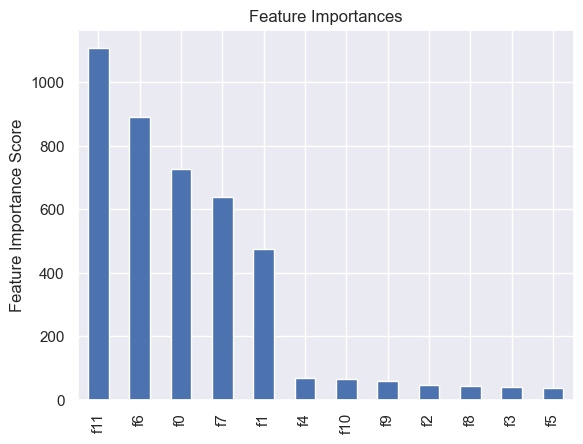

In [281]:
modelfit(XGBC_ex,X_train,Y_train)

### Optimizing using Grid search

In [280]:
XGBC_ex=xgb.XGBClassifier(eval_metric='auc',learning_rate =0.1,
 n_estimators=1000,
 max_depth=6,
 min_child_weight=3,
 gamma=0.3,
 subsample=0.8,
 colsample_bytree=0.3,
 objective= 'binary:logistic',
 reg_lambda=0.005,
 nthread=4,
 scale_pos_weight=4,       
 seed=27)

In [159]:
#Optimizing XGBOOST
params_xgb={
    'n_estimators':[int(x) for x in np.linspace(start=100, stop=400 , num=5)],
    'booster':['gbtree','gblinear','dart'],
    'eta':[0.05,0.1,0.2,0.3],
    'gamma':[0.0,0.1,0.2,0.3],
    'max_depth':[x for x in range(1,20,1)],
    'min_child_weight':[1,3,5,7],
    'subsample':[0.5,0.6,0.7,1],
    'colsample_bytree':[0.3,0.5,0.7,0.8,1],
    'reg_lambda':[0,0.5,1,3,5,8],
    'tree_method':['gpu_hist']
}

In [69]:
param_grid={"lambda_l1":[x/100 for x in range(0,10,1)],"lambda_l2":[x/100 for x in range(0,10,1)]}

In [77]:
#Optimizing CatBoost
params_cat={
    'l2_leaf_reg':[0,0.1,0.001,0.0001],
    'bootstrap_type':["Bayesian","Bernoulli","MVS","Poisson"],
    'bagging_temperature':[0,1,2,3],
    'subsample':[0.5,0.6,0.7,0.8],
    'colsample_bytree':[0.3,0.5,0.7,0.8,1],
    'random_strength':[1,2,3,4],
    'depth':[2,4,6,8,10],
    'min_data_in_leaf':[1,2,3,4],
}

In [213]:
param_grid={'scale_pos_weight':[0.5,1]}

In [249]:
gsc=GridSearchCV(estimator=xgb.XGBClassifier( n_estimators=158,learning_rate=0.1,max_depth=6,min_child_weight= 3,subsample=0.8,
 colsample_bytree=0.3,gamma=0.3,objective= 'binary:logistic',reg_lambda=0.005,seed=27), 
 param_grid = param_grid, scoring='roc_auc', cv=5,n_jobs=-1)

In [70]:
gsc=GridSearchCV(estimator=LGBM.LGBMClassifier(n_estimators=95,learning_rate=0.1,num_leaves=18,max_depth=5,lambda_l1=0,
lambda_l2=0,min_child_weight=1,min_child_samples= 65,bagging_fraction= 0.6,bagging_freq= 1,feature_fraction= 0.3,
scale_pos_weight= 1,objective= 'binary',eval_metric="auc"),
param_grid = param_grid, scoring='roc_auc', cv=5,n_jobs=-1)

In [214]:
gsc=GridSearchCV(estimator=CBC(learning_rate=0.1,iterations=772,bootstrap_type='MVS',subsample=0.6,depth=4,random_strength=3,l2_leaf_reg=3,
custom_metric = 'AUC:hints=skip_train~false',loss_function='Logloss',eval_metric='AUC',cat_features=categorical_features_indices,
scale_pos_weight=1,thread_count=-1),
param_grid = param_grid, scoring='roc_auc', cv=5,n_jobs=-1)

In [216]:
gsc.fit(X_train,Y_train)

0:	learn: 0.6634291	total: 96.6ms	remaining: 1m 14s
1:	learn: 0.7958390	total: 227ms	remaining: 1m 27s
2:	learn: 0.8645433	total: 355ms	remaining: 1m 31s
3:	learn: 0.9024551	total: 495ms	remaining: 1m 34s
4:	learn: 0.9024556	total: 621ms	remaining: 1m 35s
5:	learn: 0.9024557	total: 728ms	remaining: 1m 32s
6:	learn: 0.9186508	total: 852ms	remaining: 1m 33s
7:	learn: 0.9186507	total: 965ms	remaining: 1m 32s
8:	learn: 0.9186506	total: 1.08s	remaining: 1m 31s
9:	learn: 0.9186509	total: 1.2s	remaining: 1m 31s
10:	learn: 0.9186513	total: 1.31s	remaining: 1m 30s
11:	learn: 0.9412065	total: 1.45s	remaining: 1m 31s
12:	learn: 0.9412099	total: 1.58s	remaining: 1m 32s
13:	learn: 0.9418721	total: 1.71s	remaining: 1m 32s
14:	learn: 0.9418691	total: 1.85s	remaining: 1m 33s
15:	learn: 0.9452159	total: 1.98s	remaining: 1m 33s
16:	learn: 0.9491545	total: 2.11s	remaining: 1m 33s
17:	learn: 0.9581886	total: 2.23s	remaining: 1m 33s
18:	learn: 0.9682747	total: 2.35s	remaining: 1m 33s
19:	learn: 0.9704143	t

158:	learn: 0.9789396	total: 20.2s	remaining: 1m 18s
159:	learn: 0.9789401	total: 20.4s	remaining: 1m 17s
160:	learn: 0.9789411	total: 20.5s	remaining: 1m 17s
161:	learn: 0.9789705	total: 20.6s	remaining: 1m 17s
162:	learn: 0.9789872	total: 20.7s	remaining: 1m 17s
163:	learn: 0.9789887	total: 20.9s	remaining: 1m 17s
164:	learn: 0.9789962	total: 21s	remaining: 1m 17s
165:	learn: 0.9790078	total: 21.1s	remaining: 1m 17s
166:	learn: 0.9790143	total: 21.2s	remaining: 1m 16s
167:	learn: 0.9790089	total: 21.3s	remaining: 1m 16s
168:	learn: 0.9790188	total: 21.5s	remaining: 1m 16s
169:	learn: 0.9790191	total: 21.6s	remaining: 1m 16s
170:	learn: 0.9790230	total: 21.7s	remaining: 1m 16s
171:	learn: 0.9790251	total: 21.8s	remaining: 1m 16s
172:	learn: 0.9790252	total: 22s	remaining: 1m 16s
173:	learn: 0.9790340	total: 22.1s	remaining: 1m 15s
174:	learn: 0.9790399	total: 22.2s	remaining: 1m 15s
175:	learn: 0.9790451	total: 22.3s	remaining: 1m 15s
176:	learn: 0.9790482	total: 22.5s	remaining: 1m 1

316:	learn: 0.9803650	total: 40.4s	remaining: 58s
317:	learn: 0.9803647	total: 40.5s	remaining: 57.8s
318:	learn: 0.9803641	total: 40.6s	remaining: 57.7s
319:	learn: 0.9803649	total: 40.8s	remaining: 57.6s
320:	learn: 0.9804050	total: 40.9s	remaining: 57.5s
321:	learn: 0.9804069	total: 41s	remaining: 57.3s
322:	learn: 0.9804066	total: 41.2s	remaining: 57.2s
323:	learn: 0.9804157	total: 41.3s	remaining: 57.1s
324:	learn: 0.9804765	total: 41.4s	remaining: 57s
325:	learn: 0.9804775	total: 41.6s	remaining: 56.9s
326:	learn: 0.9804767	total: 41.7s	remaining: 56.7s
327:	learn: 0.9805122	total: 41.8s	remaining: 56.6s
328:	learn: 0.9805140	total: 41.9s	remaining: 56.4s
329:	learn: 0.9805292	total: 42s	remaining: 56.3s
330:	learn: 0.9805319	total: 42.2s	remaining: 56.2s
331:	learn: 0.9805420	total: 42.3s	remaining: 56s
332:	learn: 0.9805457	total: 42.4s	remaining: 55.9s
333:	learn: 0.9805509	total: 42.5s	remaining: 55.8s
334:	learn: 0.9805701	total: 42.7s	remaining: 55.6s
335:	learn: 0.9806167	

476:	learn: 0.9815592	total: 1m	remaining: 37.6s
477:	learn: 0.9815916	total: 1m	remaining: 37.5s
478:	learn: 0.9815918	total: 1m 1s	remaining: 37.4s
479:	learn: 0.9815930	total: 1m 1s	remaining: 37.3s
480:	learn: 0.9815943	total: 1m 1s	remaining: 37.1s
481:	learn: 0.9815960	total: 1m 1s	remaining: 37s
482:	learn: 0.9816038	total: 1m 1s	remaining: 36.9s
483:	learn: 0.9816089	total: 1m 1s	remaining: 36.7s
484:	learn: 0.9816089	total: 1m 1s	remaining: 36.6s
485:	learn: 0.9816113	total: 1m 2s	remaining: 36.5s
486:	learn: 0.9816106	total: 1m 2s	remaining: 36.4s
487:	learn: 0.9816177	total: 1m 2s	remaining: 36.2s
488:	learn: 0.9816206	total: 1m 2s	remaining: 36.1s
489:	learn: 0.9816210	total: 1m 2s	remaining: 36s
490:	learn: 0.9816473	total: 1m 2s	remaining: 35.8s
491:	learn: 0.9816603	total: 1m 2s	remaining: 35.7s
492:	learn: 0.9816737	total: 1m 2s	remaining: 35.6s
493:	learn: 0.9816759	total: 1m 3s	remaining: 35.5s
494:	learn: 0.9816771	total: 1m 3s	remaining: 35.3s
495:	learn: 0.9816780	

634:	learn: 0.9829488	total: 1m 21s	remaining: 17.6s
635:	learn: 0.9829533	total: 1m 21s	remaining: 17.5s
636:	learn: 0.9829561	total: 1m 22s	remaining: 17.4s
637:	learn: 0.9829575	total: 1m 22s	remaining: 17.3s
638:	learn: 0.9829610	total: 1m 22s	remaining: 17.1s
639:	learn: 0.9829920	total: 1m 22s	remaining: 17s
640:	learn: 0.9830032	total: 1m 22s	remaining: 16.9s
641:	learn: 0.9830231	total: 1m 22s	remaining: 16.7s
642:	learn: 0.9830233	total: 1m 22s	remaining: 16.6s
643:	learn: 0.9830302	total: 1m 22s	remaining: 16.5s
644:	learn: 0.9830308	total: 1m 23s	remaining: 16.4s
645:	learn: 0.9830385	total: 1m 23s	remaining: 16.2s
646:	learn: 0.9830487	total: 1m 23s	remaining: 16.1s
647:	learn: 0.9830493	total: 1m 23s	remaining: 16s
648:	learn: 0.9830488	total: 1m 23s	remaining: 15.8s
649:	learn: 0.9830489	total: 1m 23s	remaining: 15.7s
650:	learn: 0.9830494	total: 1m 23s	remaining: 15.6s
651:	learn: 0.9830604	total: 1m 23s	remaining: 15.5s
652:	learn: 0.9830606	total: 1m 24s	remaining: 15.

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001D9B10F8610>,
             n_jobs=-1, param_grid={'scale_pos_weight': [0.5, 1]},
             scoring='roc_auc')

In [217]:
gsc.best_params_,gsc.best_score_

({'scale_pos_weight': 1}, 0.9816380949199811)

### Optimizing using Optuna

In [201]:
#Using optuna for LGBC optimization
def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_int("n_estimators", 50,1000,step=20),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3,step=0.01),
        "num_leaves": trial.suggest_int("num_leaves", 10, 100, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12,step=1),
        "lambda_l1": trial.suggest_float("lambda_l1", 0, 0.5, step=0.001),
        "lambda_l2": trial.suggest_float("lambda_l2", 0, 0.5, step=0.001),
        "min_child_weight":trial.suggest_int("min_child_weight", 0,10,step=1),
        "min_child_samples":trial.suggest_int("min_child_samples",10,300,step=20),
        "scale_pos_weight":trial.suggest_int("scale_pos_weight",1,10,step=1),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = LGBM.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="auc",
            early_stopping_rounds=150,
            callbacks=[
                LightGBMPruningCallback(trial, "auc")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)[:,1]
        cv_scores[idx] = roc_auc_score(y_test, preds)

    return np.mean(cv_scores)

In [202]:
study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X_train, Y_train)
study.optimize(func, n_trials=20)

[I 2023-06-25 03:38:15,427] A new study created in memory with name: LGBM Classifier
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [50, 1000] and step=20, but the range is not divisible by `step`. It will be replaced by [50, 990].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [10, 300] and step=20, but the range is not divisible by `step`. It will be replaced by [10, 290].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:701: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and 

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.438
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.043000000000000003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043000000000000003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.438
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.043000000000000003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043000000000000003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\te

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.438
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.043000000000000003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043000000000000003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.438
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.043000000000000003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043000000000000003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\te

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.176
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[I 2023-06-25 03:38:34,844] Trial 1 finished with value: 0.9717473374486069 and parameters: {'n_estimators': 730, 'learning_rate': 0.04, 'num_leaves': 20, 'max_depth': 3, 'lambda_l1': 0.176, 'lambda_l2': 0.07, 'min_child_weight': 3, 'min_child_samples': 90, 'scale_pos_weight': 1, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.9718608919026261.
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [50, 1000] and step=20, but the range is not divisible by `step`. It will be replaced by [50, 990].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [10, 300] and step=20, but the range is not divisible by `step`. It will be replaced by [10, 290].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.178
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.178
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.178
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.178
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.178
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
[I 2023-06-25 03:38:40,877] Trial 2 finished with value: 0.962315085167473 and parameters: {'n_estimators': 730, 'learning_rate': 0.11, 'num_leaves': 80, 'max_depth': 4, 'lambda_l1': 0.178, 'lambda_l2': 0.394, 'min_child_weight': 1, 'min_child_samples': 290, 'scale_pos_weight': 9, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.9718608919026261.
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [50, 1000] and step=20, but the range is not divisible by `step`. It will be replaced by [50, 990].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [10, 300] and 

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0.248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0.248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\e

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0.248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\te

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0.248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l1 is set=0.248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.135
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.135
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\t

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.135
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.135
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\te

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] lambda_l1 is set=0.135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.135
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\ten

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\te

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\trial\_trial.py:490: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\Shirshak\anacond

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [50, 1000] and step=20, but the range is not divisible by `step`. It will be replaced by [50, 990].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [10, 300] and step=20, but the range is not divisible by `step`. It will be replaced by [10, 290].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:701: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l1 is set=0.031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2023-06-25 03:39:08,976] Trial 7 pruned. Trial was pruned at iteration 161.
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [50, 1000] and step=20, but the range is not divisible by `step`. It will be replaced by [50, 990].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [10, 300] and step=20, but the range is not divisible by `step`. It will be replaced by [10, 290].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:701: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will b

C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-06-25 03:39:09,847] Trial 14 pruned. Trial was pruned at iteration 1.
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [50, 1000] and step=20, but the range is not divisible by `step`. It will be replaced by [50, 990].
  warnings.warn(
C:\Users\Shirshak\anaconda3\envs\tensorflow\lib\site-packages\optuna\distributions.py:716: UserWarning: The distribution is specified by [10, 300] and step=20, but the range is not divisible by `step`. It will be replaced by [10, 290].
  warnings.warn(
C:\Users\Shirshak\anaconda3\en

##  TEST DATA

In [46]:
data_t=df_test.copy()

In [241]:
modified_test=data_t.copy()

In [242]:
#Engineered features
omega=(2*3.14*df_test['Rotational speed [rpm]'])/60
modified_test['Power']=omega*df_test['Torque [Nm]']

temp_ratio=df_test['Air temperature [K]']/df_test['Process temperature [K]']
modified_test['Temperature ratio']=temp_ratio

In [158]:
Id=[]
for val in modified_test['Product ID']:
    if val[0]=='H':
        new_id='0'+val[1:]
        Id.append(int(new_id))
    elif val[0]=='L':
        new_id='1'+val[1:]
        Id.append(int(new_id))
    else:
        new_id='2'+val[1:]
        Id.append(int(new_id))
modified_test['Product ID']=Id   

In [243]:
modified_test.drop(['Air temperature [K]','Process temperature [K]'],axis=1,inplace=True)

In [244]:
features_scale=[feature for feature in modified_test.columns if feature not in ['Machine failure','Type',"Product ID"]]

In [246]:
data_test=scale(modified_test,features_scale)

In [247]:
data_test

,id,Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Temperature ratio,Product ID,Type
0,0.0,0.192666,0.46978,0.237154,0.0,0.0,0.0,0.0,0.0,0.535812,L50896,L
1,0.000011,0.317229,0.343407,0.067194,0.0,0.0,0.0,0.0,0.0,0.526203,L53866,L
2,0.000022,0.2078,0.465659,0.379447,0.0,0.0,0.0,0.0,0.0,0.541475,L50498,L
3,0.000033,0.181024,0.601648,0.019763,0.0,0.0,0.0,0.0,0.0,0.505862,M21232,M
4,0.000044,0.201979,0.51511,0.450593,0.0,0.0,0.0,0.0,0.0,0.562795,M19751,M
...,...,...,...,...,...,...,...,...,...,...,...,...
90949,0.999956,0.183935,0.502747,0.059289,0.0,0.0,0.0,0.0,0.0,0.543927,L51130,L
90950,0.999967,0.217695,0.412088,0.12253,0.0,0.0,0.0,0.0,0.0,0.304661,L47783,L
90951,0.999978,0.19383,0.516484,0.73913,0.0,0.0,0.0,0.0,0.0,0.40345,L48097,L
90952,0.999989,0.213038,0.501374,0.272727,0.0,0.0,0.0,0.0,0.0,0.48427,L48969,L


In [248]:
test=data_test[selected_feature]

In [249]:
test

,Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,Rotational speed [rpm],Temperature ratio,Type,Product ID
0,0.46978,0.237154,0.0,0.0,0.0,0.0,0.192666,0.535812,L,L50896
1,0.343407,0.067194,0.0,0.0,0.0,0.0,0.317229,0.526203,L,L53866
2,0.465659,0.379447,0.0,0.0,0.0,0.0,0.2078,0.541475,L,L50498
3,0.601648,0.019763,0.0,0.0,0.0,0.0,0.181024,0.505862,M,M21232
4,0.51511,0.450593,0.0,0.0,0.0,0.0,0.201979,0.562795,M,M19751
...,...,...,...,...,...,...,...,...,...,...
90949,0.502747,0.059289,0.0,0.0,0.0,0.0,0.183935,0.543927,L,L51130
90950,0.412088,0.12253,0.0,0.0,0.0,0.0,0.217695,0.304661,L,L47783
90951,0.516484,0.73913,0.0,0.0,0.0,0.0,0.19383,0.40345,L,L48097
90952,0.501374,0.272727,0.0,0.0,0.0,0.0,0.213038,0.48427,L,L48969


In [47]:
test=df_test.copy()
test.drop(["id"],axis=1,inplace=True)

In [48]:
test=np.array(test)

In [49]:
y_pred=cbc.predict_proba(test)[:,1]
y_pred

array([0.00084945, 0.00116414, 0.0004677 , ..., 0.0010741 , 0.00093347,
       0.0012373 ])

In [50]:
Id=df_test['id']
output=pd.DataFrame(Id,columns=['id'])

In [51]:
output['Machine failure']=y_pred

In [54]:
output

,id,Machine failure
0,136429,0.000849
1,136430,0.001164
2,136431,0.000468
3,136432,0.001631
4,136433,0.000676
...,...,...
90949,227378,0.001353
90950,227379,0.000254
90951,227380,0.001074
90952,227381,0.000933


In [52]:
output.to_csv('submission.csv',index=False)